In [1]:
import torch
import numpy as np
import pandas as pd
import anndata as ad
import multiDGD
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os
import gc
#import statsmodels.api as sm
#from statsmodels.genmod.families import NegativeBinomial
#import multiprocessing as mp

os.chdir('../..')
os.getcwd()

'/home/vschuste/projects/interpreting_omics_models'

In [2]:
# set all random seeds to 0
torch.manual_seed(0)
np.random.seed(0)
import random
random.seed(0)

In [3]:
# load models and data
# look at relationship between gene hits and mean expression

data_dir = '/home/vschuste/data/singlecell/'
data = ad.read_h5ad(data_dir+'human_bonemarrow.h5ad')

modality_switch = len(data.var[data.var['modality'] == 'GEX'])

model = multiDGD.DGD.load(data=data, save_dir='./03_results/models/', model_name='human_bonemarrow_l20_h2-3_test50e')
with torch.no_grad():
    dispersion_factors = (torch.exp(model.decoder.out_modules[0].distribution.log_r).detach().cpu().numpy() + 1).flatten()
data = data[data.obs['train_val_test'] == 'train']

Covariate model initialized as:

        Gaussian_mix_compture:
            Dimensionality: 2
            Number of components: 4
        
#######################
Training status
#######################
True


/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/multiDGD/_dgd.py:393: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(self._sa

In [4]:
activations = torch.load('03_results/reports/sae_model_10000_l1-1e-3_lr-1e-4_500epochs_activations.pt')

# all active features
active_features = (torch.where(torch.sum(activations, dim=0) != 0)[0]).tolist()

/tmp/ipykernel_252764/2432187273.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  activations = torch.load('03_results/reports/sae_model_10000_l1-1e-3_lr-1e-4_500epochs_a

### RNA

In [5]:
# look at the dataframe with GO term analysis

go_df = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis_small_2_biological_process.csv')
go_df['go type'] = 'biological process'
go_df2 = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis_large_2_biological_process.csv')
go_df2['go type'] = 'biological process'
go_df3 = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis_small_2_molecular_function.csv')
go_df3['go type'] = 'molecular function'
go_df4 = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis_large_2_molecular_function.csv')
go_df4['go type'] = 'molecular function'
go_df = pd.concat([go_df, go_df2, go_df3, go_df4], axis=0, ignore_index=True)
#go_df = pd.concat([go_df, go_df3], axis=0, ignore_index=True)

In [6]:
# how many unique GO terms in go_df3?
go_df['go_id'].nunique()

2499

In [14]:
# how many unique go terms for biological process?
go_df[go_df['go type'] == 'biological process']['go_id'].nunique()

1875

In [16]:
# how many unique go terms for molecular function?
go_df[go_df['go type'] == 'molecular function']['go_id'].nunique()

624

In [7]:
# number of unique features
print('Number of unique features:', len(go_df['feature'].unique()))
print('That is {:.2f}% of all active features'.format(len(go_df['feature'].unique())/len(active_features)*100))

Number of unique features: 4374
That is 82.25% of all active features


### get local and global features and corresponding cell types

In [6]:
# go through all cell types and compute each features mean activation and std for ct positive and negative
cell_types = [x for x in data.obs['cell_type'].unique()]
means_positive = torch.zeros((len(cell_types), activations.shape[1]))
se_positive = torch.zeros((len(cell_types), activations.shape[1]))
means_negative = torch.zeros((len(cell_types), activations.shape[1]))
se_negative = torch.zeros((len(cell_types), activations.shape[1]))
for i, ct in enumerate(cell_types):
    data_indices = data.obs['cell_type'] == ct
    activations_pos = activations[data_indices,:]
    activations_neg = activations[~data_indices,:]
    means_positive[i,:] = torch.mean(activations_pos, dim=0).detach().cpu()
    # compute the standard error of the mean
    se_positive[i,:] = torch.std(activations_pos, dim=0).detach().cpu() / math.sqrt(activations_pos.shape[0])
    means_negative[i,:] = torch.mean(activations_neg, dim=0).detach().cpu()
    se_negative[i,:] = torch.std(activations_neg, dim=0).detach().cpu() / math.sqrt(activations_neg.shape[0])
# that gives the "significant features" per cell type
significant_features = torch.BoolTensor((means_positive - means_negative) > 1.96*(se_positive + se_negative))
sum_significant_features = torch.sum(significant_features, dim=0)

###
# unique (local) vs shared (global) features, and there is a thing in the middle which I call regional
###
# all active features
active_features = (torch.where(torch.sum(activations, dim=0) != 0)[0]).tolist()
# local features are the ct specific ones
local_features = (torch.where(sum_significant_features == 1)[0]).tolist()
regional_features = (torch.where(sum_significant_features > 1)[0]).tolist()
# all remaining active features are global
global_features = list(set(active_features).difference(set(local_features)))
print('{} active features, {} local features, {} global features'.format(len(active_features), len(local_features), len(global_features)))

5318 active features, 908 local features, 4410 global features


In [7]:
# go through them by celltype

unique_ct_features = {}
unique_ct_feature_indices = torch.where(sum_significant_features == 1)[0]
for i, ct in enumerate(cell_types):
    ct_features_temp = torch.where(significant_features[i,:])[0]
    # get the intersection with the unique features
    intersect_feats = list(set(list(ct_features_temp.numpy())).intersection(set(list(unique_ct_feature_indices.numpy()))))
    unique_ct_features[ct] = intersect_feats
    print('Cell type: {}, # unique features: {}'.format(ct, len(intersect_feats)))

Cell type: Naive CD20+ B, # unique features: 15
Cell type: CD14+ Mono, # unique features: 118
Cell type: CD8+ T, # unique features: 12
Cell type: CD16+ Mono, # unique features: 128
Cell type: B1 B, # unique features: 35
Cell type: Lymph prog, # unique features: 23
Cell type: CD4+ T naive, # unique features: 13
Cell type: CD4+ T activated, # unique features: 11
Cell type: Erythroblast, # unique features: 123
Cell type: Normoblast, # unique features: 141
Cell type: NK, # unique features: 4
Cell type: ILC, # unique features: 19
Cell type: Transitional B, # unique features: 25
Cell type: G/M prog, # unique features: 31
Cell type: MK/E prog, # unique features: 0
Cell type: HSC, # unique features: 21
Cell type: pDC, # unique features: 19
Cell type: ID2-hi myeloid prog, # unique features: 28
Cell type: Proerythroblast, # unique features: 104
Cell type: Plasma cell, # unique features: 8
Cell type: cDC2, # unique features: 28
Cell type: CD8+ T naive, # unique features: 2


/tmp/ipykernel_239970/3971213035.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, horizontalalignment='center')


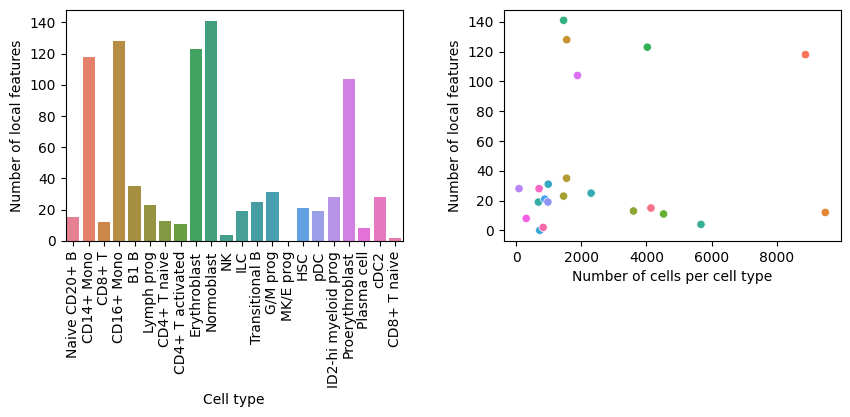

In [9]:
# plot a histogram of the number of unique features per cell type

# get the number of cells per cell type
cells_per_ct = data.obs['cell_type'].value_counts()
cells_per_ct = cells_per_ct[cell_types]
n_unique_features_per_ct = [len(unique_ct_features[ct]) for ct in cell_types]

fig, ax = plt.subplots(1, 2, figsize=(10, 3))
# add spacing
fig.subplots_adjust(wspace=0.3)
sns.barplot(x=cell_types, y=n_unique_features_per_ct, ax=ax[0], hue=cell_types)
ax[0].set_xlabel('Cell type')
ax[0].set_ylabel('Number of local features')
# rotate the x-axis labels
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, horizontalalignment='center')
sns.scatterplot(x=cells_per_ct, y=n_unique_features_per_ct, hue=cell_types, ax=ax[1])
ax[1].set_xlabel('Number of cells per cell type')
ax[1].set_ylabel('Number of local features')
ax[1].legend(title='Cell type', bbox_to_anchor=(1.05, 1), loc='upper left').set_visible(False)
plt.show()

In [8]:
go_df_feat_types = []
go_df_celltypes = []

for i in range(len(go_df)):
    feat = go_df['feature'][i]
    if feat in local_features:
        go_df_feat_types.append('local')
        # get which celltype it is unique to
        for ct in cell_types:
            if feat in unique_ct_features[ct]:
                go_df_celltypes.append(ct)
                break
    elif feat in global_features:
        go_df_feat_types.append('global')
        go_df_celltypes.append('')
    else:
        go_df_feat_types.append('')
        go_df_celltypes.append('')

go_df['feature_type'] = go_df_feat_types
go_df['celltype'] = go_df_celltypes

In [13]:
go_df.head()

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,go_name,go_level,feature,p_threshold,fold_change_threshold,go type,feature_type,celltype
0,10,4.015561,0.008313,+,2.490312,0.997960,-2.876210,0.002012,0.750454,GO:0002503,peptide antigen assembly with MHC class II pro...,7,8192,0.00001,2.0,biological process,global,
1,13,5.840816,0.010033,+,2.225716,0.997349,-2.991074,0.001390,0.715999,GO:0050778,positive regulation of immune response,5,8192,0.00001,2.0,biological process,global,
2,8,3.650510,0.032931,+,2.191475,0.998368,-3.304244,0.000476,0.801758,GO:0007274,neuromuscular synaptic transmission,8,8192,0.00001,2.0,biological process,global,
3,8,3.650510,0.032931,+,2.191475,0.998368,-2.810880,0.002470,0.756702,GO:0031666,positive regulation of lipopolysaccharide-medi...,6,8192,0.00001,2.0,biological process,global,
4,8,3.650510,0.032931,+,2.191475,0.998368,-2.235438,0.012694,0.704150,GO:0051000,positive regulation of nitric-oxide synthase a...,7,8192,0.00001,2.0,biological process,global,


In [9]:
# plot a density plot of mean vs max activations colored by global and local features
# get the mean and max activations
mean_activations = torch.mean(activations, dim=0).detach().cpu().numpy()
max_activations = torch.max(activations, dim=0)[0].detach().cpu().numpy()
nonzero_activations = torch.sum(activations != 0, dim=0).detach().cpu().numpy()
# get the feature types
feature_types = []
for i in range(activations.shape[1]):
    if i in local_features:
        feature_types.append('local')
    elif i in global_features:
        feature_types.append('global')
    else:
        feature_types.append('dead')

activ_df = pd.DataFrame({'mean': mean_activations, 'max': max_activations, 'feature type': feature_types, 'nonzero': nonzero_activations})

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


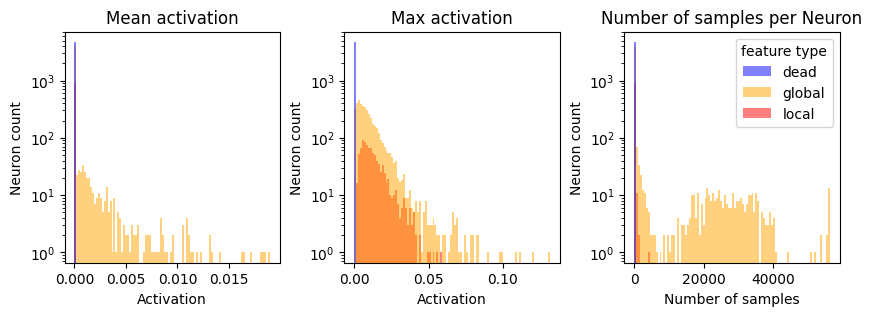

In [18]:
# make a plot with 2 histplots for mean and max
fig, ax = plt.subplots(1, 3, figsize=(10, 3))
# add spacing
fig.subplots_adjust(wspace=0.3)
sns.histplot(activ_df, x='mean', ax=ax[0], bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax[0].set_yscale('log')
ax[0].set_xlabel('Activation')
ax[0].set_ylabel('Neuron count')
ax[0].set_title('Mean activation')
ax[0].legend().remove()
sns.histplot(activ_df, x='max', ax=ax[1], bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax[1].set_yscale('log')
ax[1].set_xlabel('Activation')
ax[1].set_ylabel('Neuron count')
ax[1].set_title('Max activation')
ax[1].legend().remove()
sns.histplot(activ_df, x='nonzero', ax=ax[2], bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax[2].set_yscale('log')
ax[2].set_xlabel('Number of samples')
ax[2].set_ylabel('Neuron count')
ax[2].set_title('Number of samples per Neuron')
plt.show()

In [15]:
min(activ_df[activ_df['feature type'] == 'local']['nonzero']), max(activ_df[activ_df['feature type'] == 'local']['nonzero'])

(5, 4297)

In [16]:
min(activ_df[activ_df['feature type'] == 'global']['nonzero']), max(activ_df[activ_df['feature type'] == 'global']['nonzero'])

(1, 56308)

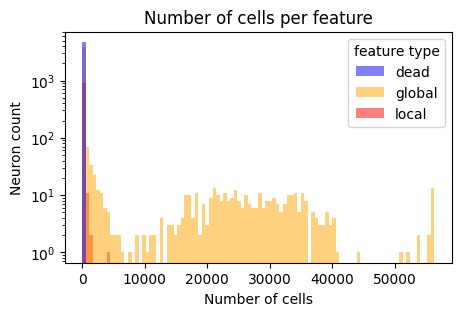

In [19]:
# plot the number of cells per feature

fig, ax = plt.subplots(1, 1, figsize=(5, 3))
sns.histplot(activ_df, x='nonzero', ax=ax, bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax.set_yscale('log')
ax.set_xlabel('Number of cells')
ax.set_ylabel('Neuron count')
ax.set_title('Number of cells per feature')
plt.show()

### checks of left out features:

There seems to be no systematic bias in the left out features, at least not wrt to number of zeros or average activation (apart from the dead ones we left out).

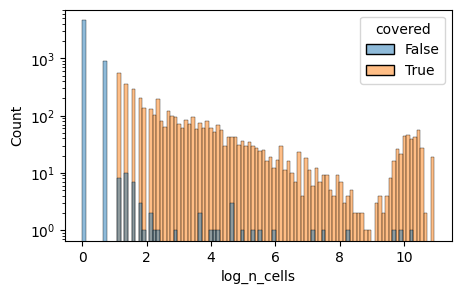

In [20]:
# plot a histogram of covered vs non covered features wrt the number of cells

n_zeros_per_feature = (activations == 0).sum(dim=0)
temp_df = pd.DataFrame({
    'n_cells': (activations.shape[0] - n_zeros_per_feature).numpy(),
    'covered': [x in go_df['feature'].unique() for x in range(activations.shape[1])]
})

fig, ax = plt.subplots(1, 1, figsize=(5, 3))
# create logwise bins
temp_df['log_n_cells'] = np.log1p(temp_df['n_cells'])
sns.histplot(data=temp_df, x='log_n_cells', hue='covered', bins=100, ax=ax)
#sns.histplot(data=temp_df, x='n_cells', hue='covered', bins=100, ax=ax)
ax.set_yscale('log')
#ax.set_xscale('log')
plt.show()

### Unique GO terms

In [21]:
# count how often each unique go term appears in the b1b features
print(go_df['go_name'].value_counts())

immune response                                    2611
cell surface receptor signaling pathway            2497
structural constituent of ribosome                 2432
adaptive immune response                           2430
inflammatory response                              2417
                                                   ... 
phosphate-containing compound metabolic process       1
protein localization to microtubule                   1
response to lead ion                                  1
regulation of cellular senescence                     1
phosphoprotein binding                                1
Name: go_name, Length: 2499, dtype: int64


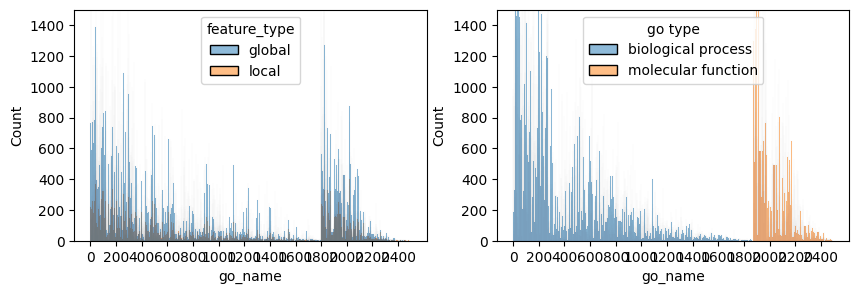

In [22]:
# make a histogram

# give every go term an index
go_ids = go_df['go_id'].unique()
go_id_dict = {go_ids[i]: i for i in range(len(go_ids))}
go_df['go_idx'] = go_df['go_id'].map(go_id_dict)
# make a dataframe with the idx and count
go_counts = go_df['go_idx'].value_counts().reset_index()

fig, ax = plt.subplots(1, 2, figsize=(10, 3))
# add spacing
fig.subplots_adjust(wspace=0.2)
sns.histplot(data=go_df.sort_values('feature_type'), x='go_name', hue='feature_type', ax=ax[0], alpha=0.5)
ax[0].set_xticks(range(0, len(go_ids), 200))
ax[0].set_xticklabels(range(0, len(go_ids), 200))
ax[0].set_ylim(0, 1500)
sns.histplot(data=go_df, x='go_name', hue='go type', ax=ax[1])
# set the indices of go_idx as xticks (every 1000)
ax[1].set_ylim(0, 1500)
ax[1].set_xticks(range(0, len(go_ids), 200))
ax[1].set_xticklabels(range(0, len(go_ids), 200))
#plt.xticks([])
plt.show()

In [97]:
go_df

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,...,celltype,go_idx,parent_go_id_level1,parent_go_name_level1,parent_go_id_level2,parent_go_name_level2,parent_go_id_level3,parent_go_name_level3,parent_go_id_level4,parent_go_name_level4
0,10,4.015561,8.312623e-03,+,2.490312,0.997960,-2.876210,2.012408e-03,0.750454,GO:0002503,...,,0,GO:0009987,cellular process,GO:0071840,cellular component organization or biogenesis,GO:0016043,cellular component organization,GO:0043933,protein-containing complex organization
1,13,5.840816,1.003337e-02,+,2.225716,0.997349,-2.991074,1.389992e-03,0.715999,GO:0050778,...,,1,GO:0065007,biological regulation,GO:0050789,regulation of biological process,GO:0002682,regulation of immune system process,GO:0002684,positive regulation of immune system process
2,8,3.650510,3.293112e-02,+,2.191475,0.998368,-3.304244,4.761641e-04,0.801758,GO:0007274,...,,2,GO:0009987,cellular process,GO:0007154,cell communication,GO:0007267,cell-cell signaling,GO:0099536,synaptic signaling
3,8,3.650510,3.293112e-02,+,2.191475,0.998368,-2.810880,2.470312e-03,0.756702,GO:0031666,...,,3,GO:0065007,biological regulation,GO:0050789,regulation of biological process,GO:0048583,regulation of response to stimulus,GO:0009966,regulation of signal transduction
4,8,3.650510,3.293112e-02,+,2.191475,0.998368,-2.235438,1.269432e-02,0.704150,GO:0051000,...,,4,GO:0065007,biological regulation,GO:0065009,regulation of molecular function,GO:0050790,regulation of catalytic activity,GO:0051341,regulation of oxidoreductase activity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578333,4,12.170352,1.362332e-02,-,0.328668,0.998654,-2.240786,1.251999e-02,0.587405,GO:0019003,...,,2016,GO:0005488,binding,GO:0036094,small molecule binding,GO:0043167,ion binding,GO:0043168,anion binding
578334,2,7.966049,3.059156e-02,-,0.251066,0.999327,-2.182858,1.452312e-02,0.605168,GO:0019843,...,,2066,GO:0005488,binding,GO:0097159,organic cyclic compound binding,GO:0003676,nucleic acid binding,GO:0003723,RNA binding
578335,1,33.413149,1.895910e-13,-,0.029928,0.999664,-10.415990,1.048023e-25,0.746089,GO:0003735,...,,1884,GO:0005198,structural molecule activity,GO:0003735,structural constituent of ribosome,GO:0003735,structural constituent of ribosome,GO:0003735,structural constituent of ribosome
578336,0,5.753257,5.645492e-03,-,0.000000,1.000000,-2.258058,1.197103e-02,0.627966,GO:0004712,...,,2300,GO:0003824,catalytic activity,GO:0140096,"catalytic activity, acting on a protein",GO:0004672,protein kinase activity,GO:0004712,protein serine/threonine/tyrosine kinase activity


In [10]:
# show me the go terms with 10 to 100 hits
go_value_counts = go_df['go_name'].value_counts()
go_df = go_df[(go_df['n_hits'] >= 1) & (go_df['mw_pval'] <= 0.01)]
go_df

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,go_name,go_level,feature,p_threshold,fold_change_threshold,go type,feature_type,celltype
0,10,4.015561,8.312623e-03,+,2.490312,0.997960,-2.876210,2.012408e-03,0.750454,GO:0002503,peptide antigen assembly with MHC class II pro...,7,8192,0.00001,2.0,biological process,global,
1,13,5.840816,1.003337e-02,+,2.225716,0.997349,-2.991074,1.389992e-03,0.715999,GO:0050778,positive regulation of immune response,5,8192,0.00001,2.0,biological process,global,
2,8,3.650510,3.293112e-02,+,2.191475,0.998368,-3.304244,4.761641e-04,0.801758,GO:0007274,neuromuscular synaptic transmission,8,8192,0.00001,2.0,biological process,global,
3,8,3.650510,3.293112e-02,+,2.191475,0.998368,-2.810880,2.470312e-03,0.756702,GO:0031666,positive regulation of lipopolysaccharide-medi...,6,8192,0.00001,2.0,biological process,global,
6,24,12.046683,2.022721e-03,+,1.992250,0.995105,-5.303233,5.688491e-08,0.766835,GO:0006959,humoral immune response,3,8192,0.00001,2.0,biological process,global,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578327,35,58.196411,1.426136e-03,-,0.601412,0.988223,-3.056880,1.118270e-03,0.554957,GO:0031625,ubiquitin protein ligase binding,5,6143,0.00001,2.0,molecular function,global,
578329,10,19.915122,2.362724e-02,-,0.502131,0.996635,-2.544010,5.479392e-03,0.577675,GO:0003690,double-stranded DNA binding,5,6143,0.00001,2.0,molecular function,global,
578330,8,16.374656,3.434374e-02,-,0.488560,0.997308,-2.326490,9.996221e-03,0.578291,GO:0051087,protein-folding chaperone binding,3,6143,0.00001,2.0,molecular function,global,
578332,3,9.072444,4.332708e-02,-,0.330672,0.998991,-2.641476,4.127278e-03,0.619274,GO:0001784,phosphotyrosine residue binding,5,6143,0.00001,2.0,molecular function,global,


In [338]:
go_value_counts[go_value_counts >= 10].sort_values(ascending=True).head(50)

branching involved in ureteric bud morphogenesis                           10
response to axon injury                                                    10
somatic stem cell population maintenance                                   10
limb development                                                           10
myelination in peripheral nervous system                                   10
positive regulation of nuclear-transcribed mRNA poly(A) tail shortening    10
MAP kinase kinase activity                                                 10
UV-damage excision repair                                                  10
fatty acid beta-oxidation                                                  10
cellular response to angiotensin                                           10
protein phosphatase 2A binding                                             10
protein targeting to vacuole                                               10
rRNA catabolic process                                          

In [121]:
# show me the go terms with 10 to 100 hits
go_value_counts = go_df['go_name'].value_counts()
terms_between_10_and_100 = go_value_counts[(go_value_counts >= 10) & (go_value_counts <= 100)].index.tolist()
go_counts_filtered = go_df[(go_df['go_name'].isin(terms_between_10_and_100)) & (go_df['n_hits'] >= 1) & (go_df['mw_pval'] <= 0.01)]
go_counts_filtered

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,...,celltype,go_idx,parent_go_id_level1,parent_go_name_level1,parent_go_id_level2,parent_go_name_level2,parent_go_id_level3,parent_go_name_level3,parent_go_id_level4,parent_go_name_level4
38,1,5.840816,0.036511,-,0.171209,0.999796,-2.736818,0.003102,0.302362,GO:0085020,...,,38,GO:0009987,cellular process,GO:0008152,metabolic process,GO:0043170,macromolecule metabolic process,GO:0043412,macromolecule modification
85,1,5.840816,0.036511,-,0.171209,0.999796,-2.736818,0.003102,0.302362,GO:0085020,...,,38,GO:0009987,cellular process,GO:0008152,metabolic process,GO:0043170,macromolecule metabolic process,GO:0043412,macromolecule modification
197,3,0.700469,0.034128,+,4.282844,0.996173,-2.790660,0.002630,0.732668,GO:0001921,...,,143,GO:0065007,biological regulation,GO:0050789,regulation of biological process,GO:0048518,positive regulation of biological process,GO:0023056,positive regulation of signaling
372,1,5.840816,0.036511,-,0.171209,0.999796,-2.736818,0.003102,0.302362,GO:0085020,...,,38,GO:0009987,cellular process,GO:0008152,metabolic process,GO:0043170,macromolecule metabolic process,GO:0043412,macromolecule modification
484,3,0.700469,0.034128,+,4.282844,0.996173,-2.790660,0.002630,0.732668,GO:0001921,...,,143,GO:0065007,biological regulation,GO:0050789,regulation of biological process,GO:0048518,positive regulation of biological process,GO:0023056,positive regulation of signaling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578286,4,1.031941,0.020962,+,3.876190,0.997114,-2.578598,0.004960,0.264511,GO:0051880,...,,2339,GO:0005488,binding,GO:0097159,organic cyclic compound binding,GO:0003676,nucleic acid binding,GO:0003677,DNA binding
578287,6,1.651106,0.006953,+,3.633929,0.995671,-3.382296,0.000359,0.255749,GO:0070628,...,,2372,GO:0005488,binding,GO:0044877,protein-containing complex binding,GO:0070628,proteasome binding,GO:0070628,proteasome binding
578289,4,1.135135,0.028355,+,3.523810,0.997114,-3.332474,0.000430,0.209816,GO:0140463,...,,2214,GO:0060090,molecular adaptor activity,GO:0030674,protein-macromolecule adaptor activity,GO:0140463,chromatin-protein adaptor activity,GO:0140463,chromatin-protein adaptor activity
578303,5,1.754300,0.033097,+,2.850140,0.996392,-3.371063,0.000374,0.263820,GO:0106222,...,,2423,GO:0005488,binding,GO:0097159,organic cyclic compound binding,GO:0003676,nucleic acid binding,GO:0003723,RNA binding


### create GO parents

In [11]:
from goatools.obo_parser import GODag
obodag = GODag("01_data/go-basic.obo")

01_data/go-basic.obo: fmt(1.2) rel(2024-10-27) 44,017 Terms


In [12]:
# for each go term, create a list of all parents
go_terms = go_df['go_id'].unique()
print(len(go_terms))
go_terms_ancestry = {}

for go_term in go_terms:
    go_obj = obodag[go_term]
    level = go_obj.level
    out_parents = []
    out_levels = []
    while level > 1:
        parents = list(go_obj.parents)
        if len(parents) > 1:
            # get the parent with level-1
            for parent in parents:
                if parent.level == level - 1:
                    go_obj = parent
                    break
        else:
            go_obj = parents[0]
        out_parents.append(go_obj.id)
        out_levels.append(go_obj.level)
        level = go_obj.level
    go_terms_ancestry[go_term] = {'parents': out_parents, 'levels': out_levels}

2214


In [13]:
parent_go_ids = []

for go_term in go_terms_ancestry.keys():
    if len(go_terms_ancestry[go_term]['parents']) == 0:
        continue
    last_level = go_terms_ancestry[go_term]['levels'][-1]
    if last_level == 1:
        #print(go_terms_ancestry[go_term]['parents'])
        #print(go_terms_ancestry[go_term]['parents'][-1])
        parent_go_ids.append(go_terms_ancestry[go_term]['parents'][-1])

parent_go_ids = list(set(parent_go_ids))
print('There are {} parent go terms (level 1)'.format(len(parent_go_ids)))

There are 34 parent go terms (level 1)


In [14]:
go_df['parent_go_id_level1'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-1] if len(go_terms_ancestry[x]['parents']) > 0 else x)
go_df['parent_go_name_level1'] = go_df['parent_go_id_level1'].apply(lambda x: obodag[x].name)
#go_df['parent_go_id_level2'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-2] if len(go_terms_ancestry[x]['parents']) > 1 else x if len(go_terms_ancestry[x]['parents']) == 1 else '')
go_df['parent_go_id_level2'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-2] if len(go_terms_ancestry[x]['parents']) > 1 else x)
go_df['parent_go_name_level2'] = go_df['parent_go_id_level2'].apply(lambda x: obodag[x].name if x != '' else '')
#go_df['parent_go_id_level3'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-3] if len(go_terms_ancestry[x]['parents']) > 2 else x if len(go_terms_ancestry[x]['parents']) == 2 else '')
go_df['parent_go_id_level3'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-3] if len(go_terms_ancestry[x]['parents']) > 2 else x)
go_df['parent_go_name_level3'] = go_df['parent_go_id_level3'].apply(lambda x: obodag[x].name if x != '' else '')
#go_df['parent_go_id_level4'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-4] if len(go_terms_ancestry[x]['parents']) > 3 else x if len(go_terms_ancestry[x]['parents']) == 3 else '')
go_df['parent_go_id_level4'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-4] if len(go_terms_ancestry[x]['parents']) > 3 else x)
go_df['parent_go_name_level4'] = go_df['parent_go_id_level4'].apply(lambda x: obodag[x].name if x != '' else '')

In [21]:
go_df

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,...,feature_type,celltype,parent_go_id_level1,parent_go_name_level1,parent_go_id_level2,parent_go_name_level2,parent_go_id_level3,parent_go_name_level3,parent_go_id_level4,parent_go_name_level4
0,10,4.015561,8.312623e-03,+,2.490312,0.997960,-2.876210,2.012408e-03,0.750454,GO:0002503,...,global,,GO:0009987,cellular process,GO:0071840,cellular component organization or biogenesis,GO:0016043,cellular component organization,GO:0022607,cellular component assembly
1,13,5.840816,1.003337e-02,+,2.225716,0.997349,-2.991074,1.389992e-03,0.715999,GO:0050778,...,global,,GO:0065007,biological regulation,GO:0050789,regulation of biological process,GO:0048518,positive regulation of biological process,GO:0002684,positive regulation of immune system process
2,8,3.650510,3.293112e-02,+,2.191475,0.998368,-3.304244,4.761641e-04,0.801758,GO:0007274,...,global,,GO:0009987,cellular process,GO:0007154,cell communication,GO:0007267,cell-cell signaling,GO:0099536,synaptic signaling
3,8,3.650510,3.293112e-02,+,2.191475,0.998368,-2.810880,2.470312e-03,0.756702,GO:0031666,...,global,,GO:0065007,biological regulation,GO:0050789,regulation of biological process,GO:0048583,regulation of response to stimulus,GO:0032101,regulation of response to external stimulus
6,24,12.046683,2.022721e-03,+,1.992250,0.995105,-5.303233,5.688491e-08,0.766835,GO:0006959,...,global,,GO:0050896,response to stimulus,GO:0006955,immune response,GO:0006959,humoral immune response,GO:0006959,humoral immune response
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578327,35,58.196411,1.426136e-03,-,0.601412,0.988223,-3.056880,1.118270e-03,0.554957,GO:0031625,...,global,,GO:0005488,binding,GO:0005515,protein binding,GO:0019899,enzyme binding,GO:0044389,ubiquitin-like protein ligase binding
578329,10,19.915122,2.362724e-02,-,0.502131,0.996635,-2.544010,5.479392e-03,0.577675,GO:0003690,...,global,,GO:0005488,binding,GO:0097159,organic cyclic compound binding,GO:0003676,nucleic acid binding,GO:0003677,DNA binding
578330,8,16.374656,3.434374e-02,-,0.488560,0.997308,-2.326490,9.996221e-03,0.578291,GO:0051087,...,global,,GO:0005488,binding,GO:0005515,protein binding,GO:0051087,protein-folding chaperone binding,GO:0051087,protein-folding chaperone binding
578332,3,9.072444,4.332708e-02,-,0.330672,0.998991,-2.641476,4.127278e-03,0.619274,GO:0001784,...,global,,GO:0005488,binding,GO:0005515,protein binding,GO:0051219,phosphoprotein binding,GO:0045309,protein phosphorylated amino acid binding


### create the GO-feature matrix

In [15]:
# create a matrix of all go terms and features

go_feature_matrix = torch.zeros((len(go_df['go_name'].unique()), activations.shape[1]))

for i, go_id in enumerate(go_df['go_id'].unique()):
    for feat in go_df[go_df['go_id'] == go_id]['feature']:
        go_feature_matrix[i,feat] = 1

# remove all columns with zero sum (unused features)
mtrx_go_ids = go_df['go_id'].unique()
mtrx_go_names = [obodag[x].name for x in mtrx_go_ids]
mtrx_feature_ids = torch.where(go_feature_matrix.sum(dim=0) > 0)[0]

go_feature_matrix = go_feature_matrix[:,torch.where(go_feature_matrix.sum(dim=0) > 0)[0]]

In [122]:
# create a matrix of all go terms and features

go_feature_matrix_filtered = torch.zeros((len(go_counts_filtered['go_name'].unique()), activations.shape[1]))

for i, go_id in enumerate(go_counts_filtered['go_id'].unique()):
    for feat in go_counts_filtered[go_counts_filtered['go_id'] == go_id]['feature']:
        go_feature_matrix_filtered[i,feat] = 1

# remove all columns with zero sum (unused features)
mtrx_go_ids_filtered = go_counts_filtered['go_id'].unique()
mtrx_go_names_filtered = [obodag[x].name for x in mtrx_go_ids_filtered]
mtrx_feature_ids_filtered = torch.where(go_feature_matrix_filtered.sum(dim=0) > 0)[0]

go_feature_matrix_filtered = go_feature_matrix_filtered[:,torch.where(go_feature_matrix_filtered.sum(dim=0) > 0)[0]]

### create a word cloud of the GO terms

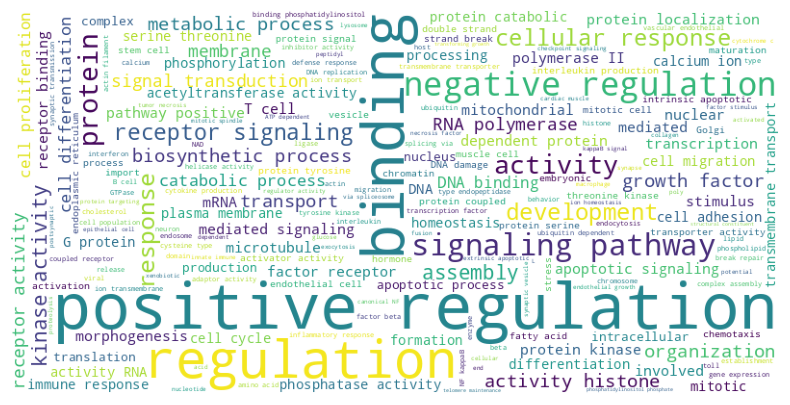

In [288]:
# create a word cloud of the go terms

#!pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(' '.join(mtrx_go_names))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

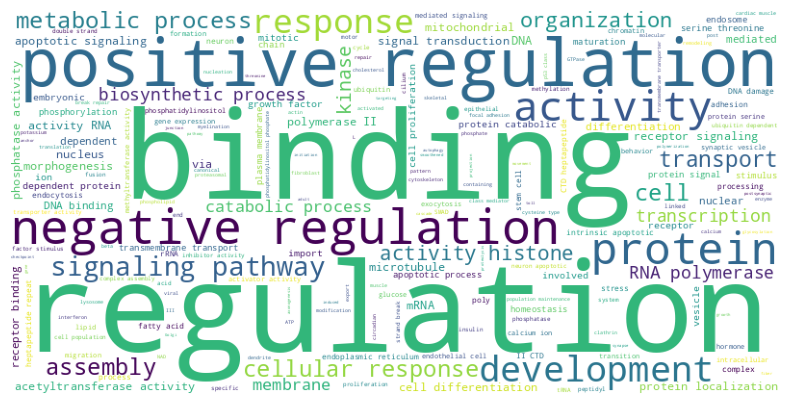

In [123]:
# create a word cloud of the go terms

#!pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(' '.join(mtrx_go_names_filtered))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [43]:
# let chatgpt create a one-sentence summary of a feature's function based on its associated go terms

for feat in go_df['feature'].unique():
    go_ids = go_df[go_df['feature'] == feat]['go_id'].unique()
    go_names = [obodag[x].name for x in go_ids]
    # now promt this to chatgpt
    if feat in [2306, 1238, 5205, 1500]:
        print(feat, go_names)

2306 ['regulation of DNA-templated DNA replication initiation', 'double-strand break repair via break-induced replication', 'DNA unwinding involved in DNA replication', 'cellular response to interleukin-4', 'DNA replication initiation', 'protein insertion into mitochondrial inner membrane', 'mitochondrial electron transport, ubiquinol to cytochrome c', 'homologous chromosome pairing at meiosis', 'fatty acid beta-oxidation using acyl-CoA dehydrogenase', 'positive regulation of protein localization to Cajal body', 'regulation of G2/M transition of mitotic cell cycle', 'cell redox homeostasis', 'DNA replication checkpoint signaling', 'kinetochore assembly', 'response to cadmium ion', 'cellular response to nitric oxide', 'ATP biosynthetic process', 'protein targeting to mitochondrion', 'resolution of meiotic recombination intermediates', 'hydrogen peroxide catabolic process', 'DNA replication', 'proton motive force-driven ATP synthesis', 'chaperone-mediated protein complex assembly', 'posi

### UMAPs

/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/umap/umap_.py:1401: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


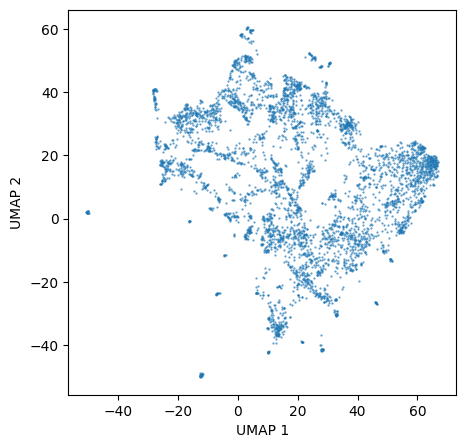

In [16]:
import umap

reducer = umap.UMAP(n_components=2, min_dist=0.5, n_neighbors=20, random_state=0, spread=10)
embedding = reducer.fit_transform(go_feature_matrix.T)

df_umap = pd.DataFrame(embedding, columns=['UMAP 1', 'UMAP 2'])
df_umap['feature'] = mtrx_feature_ids.numpy()

# plot the UMAP

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', s=2, alpha=0.7, ec=None)
plt.show()

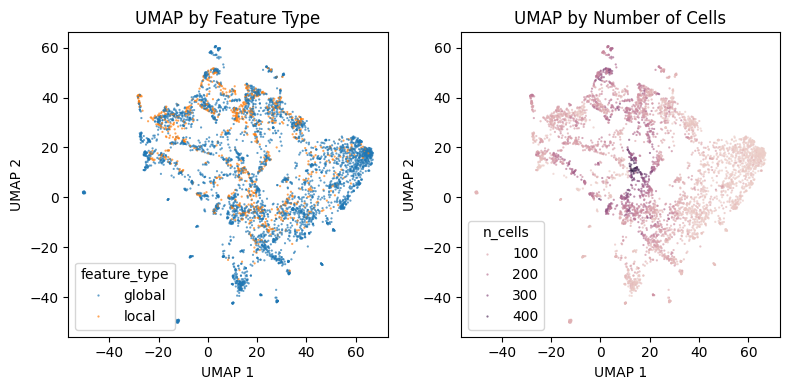

In [21]:
df_umap['feature_type'] = ['local' if x in local_features else 'global' for x in df_umap['feature']]
n_cells_per_feature = go_feature_matrix.sum(dim=0).numpy()
df_umap['n_cells'] = n_cells_per_feature

# plot by feature type
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='feature_type', s=2, alpha=0.7, ec=None, ax=ax[0])
ax[0].set_title('UMAP by Feature Type')

# plot by number of cells
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='n_cells', s=2, alpha=0.7, ec=None, ax=ax[1])
ax[1].set_title('UMAP by Number of Cells')

plt.tight_layout()
plt.show()

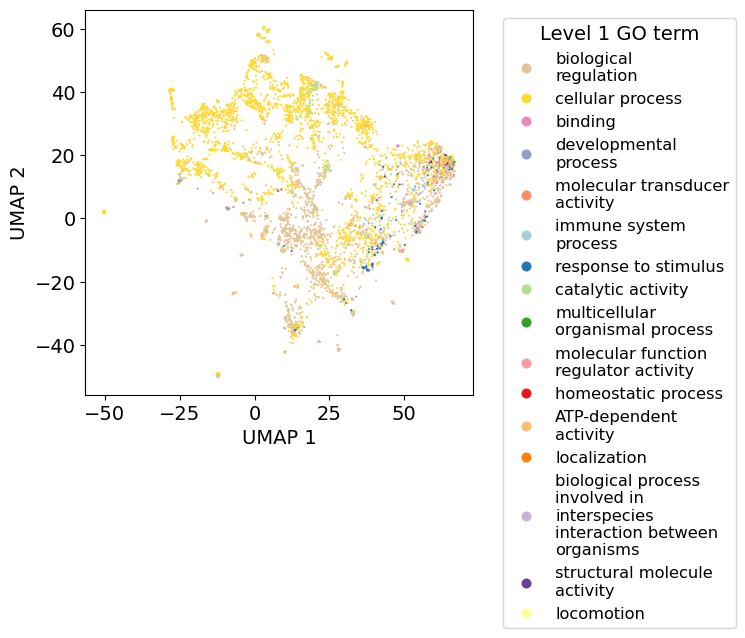

In [291]:
# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []

for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    level_1_mtrx_terms.append(temp_go_term)

df_umap['level_1_go_term'] = level_1_mtrx_terms

level1_paletteb = sns.color_palette('Paired')
level1_palettea = sns.color_palette('Set2_r')
level1_palettea = level1_palettea[:2] + level1_palettea[3:]
level1_palette = level1_palettea + level1_paletteb
level1_palette = level1_palette[:len(df_umap['level_1_go_term'].unique())]

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=2, alpha=1, ec=None, palette=level1_palette)
# if a legend handle is longer than 20 characters, break it up
handles, labels = ax.get_legend_handles_labels()
import textwrap
new_labels = [textwrap.fill(label, 20) for label in labels]
# also make the legend markers larger by scaling
ax.legend(handles, new_labels, title='Level 1 GO term', loc='upper right', bbox_to_anchor=(1.7, 1), markerscale=5)
plt.show()

/tmp/ipykernel_2077617/2258405966.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ticklabels, rotation=90, horizontalalignment='center')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


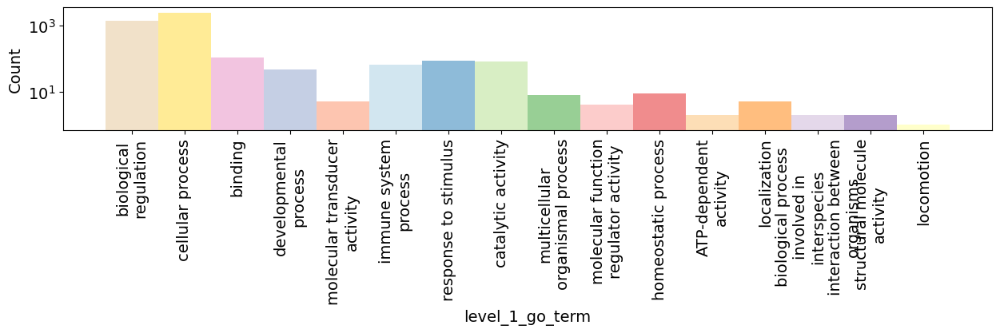

In [292]:
# plot a histogram of the first level go terms

fig, ax = plt.subplots(1, 1, figsize=(15, 2))
# add a gap between the bars
sns.histplot(data=df_umap, x='level_1_go_term', ax=ax, hue='level_1_go_term', palette=level1_palette, linewidth=0)
# rotate the x-axis labels
ticklabels = ax.get_xticklabels()
# wrap the labels
ticklabels = [textwrap.fill(label.get_text(), 20) for label in ticklabels]
ax.set_xticklabels(ticklabels, rotation=90, horizontalalignment='center')
# remove legend
ax.legend().remove()
# log scale
ax.set_yscale('log')
plt.show()

In [24]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

plt.rcParams.update({'font.size': 14})
plt.rcParams.update({'legend.fontsize': 'small'})

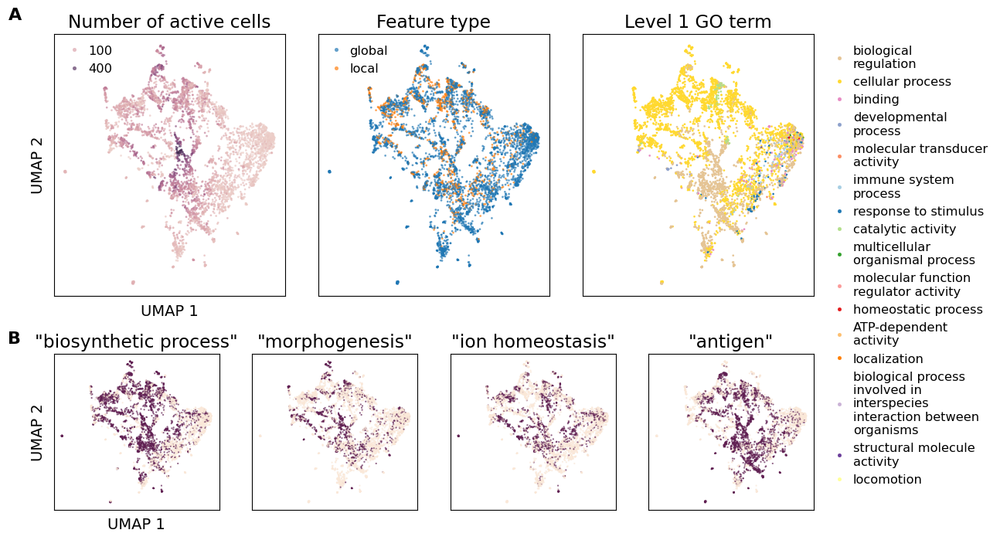

In [294]:
# create a nice grid plot with 6 columns and 4 rows

n_cols = 15
n_rows = 5

legend_x = 0.3
legend_y = 1
handletextpad = 0.1
markerscale = 2

fig = plt.figure(figsize=(16, 8))
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(n_rows, n_cols, wspace=1.0, hspace=1.2)
ax_list = []

# the first row are umaps and span over 2 rows
ax_list.append(plt.subplot(gs[0:3, 0:4]))
# add "A" on the grid
ax_list[0].text(-0.14, 1.1, 'A', transform=ax_list[0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
# here color by number of cells
n_cells_per_feature = go_feature_matrix.sum(dim=0).numpy()
df_umap['n_cells'] = n_cells_per_feature
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='n_cells', s=3, alpha=0.7, ec=None, ax=ax_list[0])
# remove all ticks
ax_list[0].set_xticks([])
ax_list[0].set_yticks([])
# move the legend outside
# keep only the first and last legend handles and labels
handles, labels = ax_list[0].get_legend_handles_labels()
handles = [handles[0], handles[-1]]
labels = [labels[0], labels[-1]]
ax_list[0].legend(handles, labels, loc='upper right', bbox_to_anchor=(legend_x, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale)
ax_list[0].set_title('Number of active cells')

# next plot a umap colored by feature type
ax_list.append(plt.subplot(gs[0:3, 4:8]))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='feature_type', s=3, alpha=0.7, ec=None, ax=ax_list[1])
ax_list[1].set_xticks([])
ax_list[1].set_yticks([])
ax_list[1].set_xlabel('')
ax_list[1].set_ylabel('')
ax_list[1].legend(loc='upper right', bbox_to_anchor=(legend_x+0.05, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale)
ax_list[1].set_title('Feature type')

# next plot a umap colored by level1 go term
ax_list.append(plt.subplot(gs[0:3, 8:12]))
# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []
for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    level_1_mtrx_terms.append(temp_go_term)
df_umap['level_1_go_term'] = level_1_mtrx_terms
level1_paletteb = sns.color_palette('Paired')
level1_palettea = sns.color_palette('Set2_r')
level1_palettea = level1_palettea[:2] + level1_palettea[3:]
level1_palette = level1_palettea + level1_paletteb
level1_palette = level1_palette[:len(df_umap['level_1_go_term'].unique())]
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=3, alpha=1, ec=None, palette=level1_palette, ax=ax_list[2])
ax_list[2].set_xticks([])
ax_list[2].set_yticks([])
ax_list[2].set_xlabel('')
ax_list[2].set_ylabel('')
ax_list[2].set_title('Level 1 GO term')
#ax_list[2].legend().remove()
# wrap the text for the legend
handles, labels = ax_list[2].get_legend_handles_labels()
labels = [textwrap.fill(label, 20) for label in labels]
ax_list[2].legend(handles, labels, loc='upper right', bbox_to_anchor=(1.8, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale, ncol=1)

binary_colors = sns.color_palette('rocket_r', 100)
binary_colors = [binary_colors[0], binary_colors[75]]

ax_list.append(plt.subplot(gs[3:5, 0:3]))
ax_list[-1].text(-0.2, 1.15, 'B', transform=ax_list[-1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
term_snippet = 'biosynthetic process'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 3:6]))
term_snippet = 'morphogenesis'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 6:9]))
term_snippet = 'ion homeostasis'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 9:12]))
term_snippet = 'antigen'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

# save as a pdf
#plt.savefig('03_results/figures/sc_automatic_feature_analysis_2.pdf', bbox_inches='tight')
plt.show()

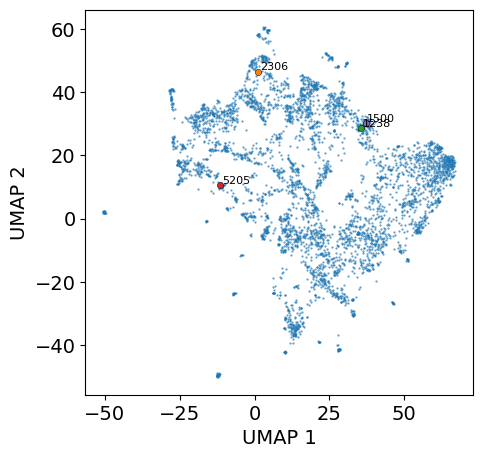

In [295]:
# show me where feature 2306 is
special_features = [2306, 1238, 5205, 1500]

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', s=2, alpha=0.7, ec=None, ax=ax)
for feat in special_features:
    temp_df = df_umap[df_umap['feature'] == feat]
    sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', s=20, ec='black', ax=ax)
    # write the feature number next to the point
    for i, row in temp_df.iterrows():
        ax.text(row['UMAP 1']+0.5, row['UMAP 2']+0.5, row['feature'], fontsize=8, color='black')
plt.show()

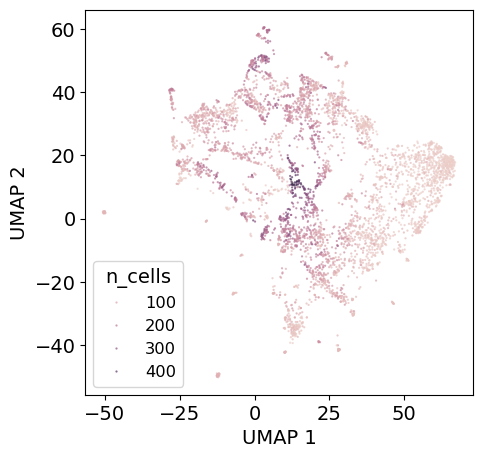

In [296]:
# plot the umap colored by number of cells per feature

n_cells_per_feature = go_feature_matrix.sum(dim=0).numpy()
df_umap['n_cells'] = n_cells_per_feature

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='n_cells', s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

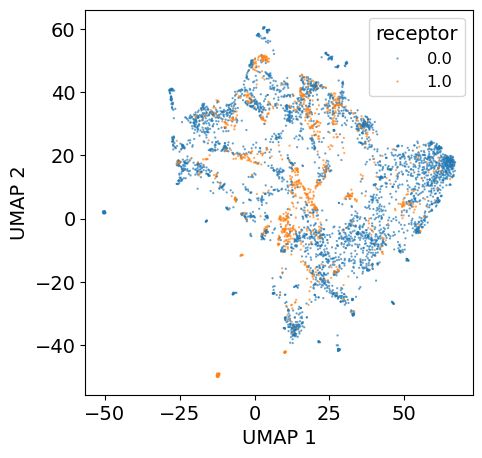

In [297]:
# what about receptors

receptor_go_terms = [1 if 'receptor' in x else 0 for x in mtrx_go_names]
receptor_counts = go_feature_matrix[receptor_go_terms,:].sum(dim=0)
# binarize
receptor_counts = (receptor_counts > 0).float()
df_umap['receptor'] = receptor_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='receptor', s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 24 GO terms with 'protein localization' in their name


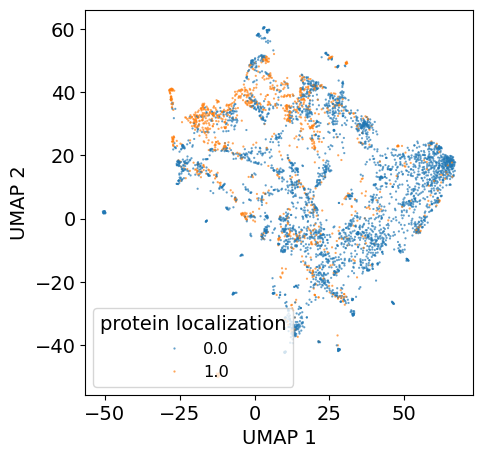

In [298]:
# what about receptors

term_snippet = 'protein localization'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

/tmp/ipykernel_239970/2800308277.py:29: UserWarning: 
The palette list has fewer values (18) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax_list[-1], palette=temp_palette, sizes=(10, 1))
/tmp/ipykernel_239970/2800308277.py:29: UserWarning: 
The palette list has fewer values (9) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax_list[-1], palette=temp_palette, sizes=(10, 1))


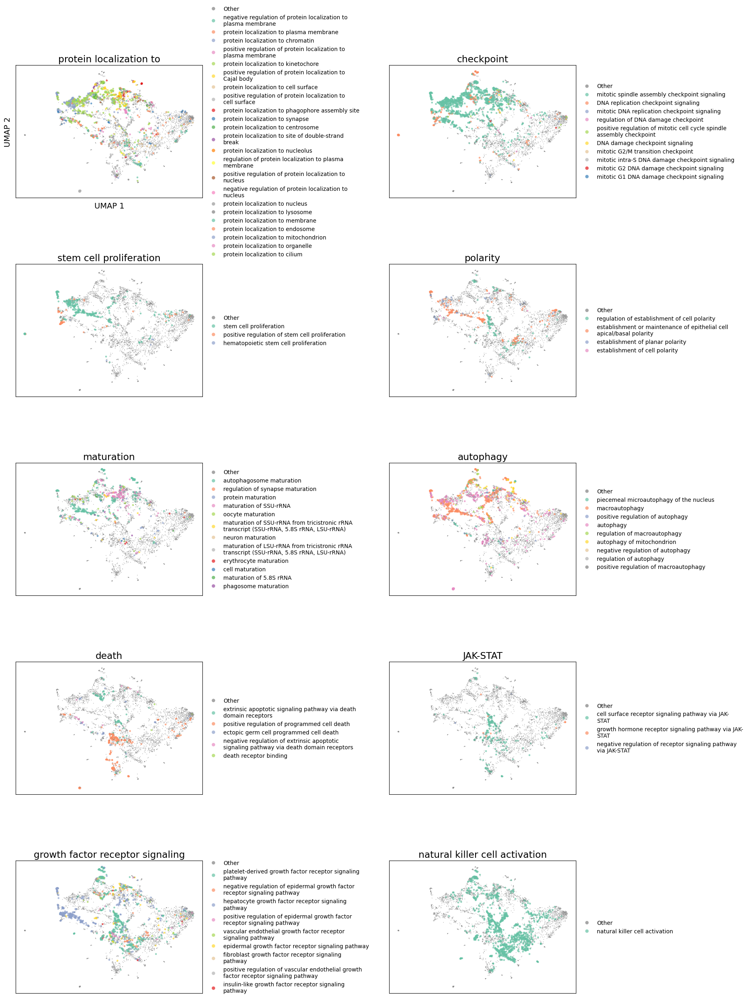

In [56]:
probing_snippets = ['protein localization to', 'checkpoint', 'stem cell proliferation', 'polarity', 'maturation', 'autophagy', 'death', 'JAK-STAT', 'growth factor receptor signaling', 'natural killer cell activation']

n_cols = 2
n_rows = 5

fig = plt.figure(figsize=(18, n_rows * 6))
import matplotlib.gridspec as gridspec
import textwrap
gs = gridspec.GridSpec(n_rows, n_cols, wspace=1.0, hspace=0.5)
ax_list = []

for i, term_snippet in enumerate(probing_snippets):
    ax_list.append(plt.subplot(gs[i//n_cols, i%n_cols]))
    test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
    unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
    test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
    # get the index of the max count
    max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
    test_counts = (test_counts > 0).float()
    df_temp = df_umap.copy()
    #df_temp[term_snippet] = test_counts.numpy()
    df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
    df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
    # create a legend where the first color is grey and the rest is default
    temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
    temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
    df_temp['relevant'] = test_counts.numpy()

    sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax_list[-1], palette=temp_palette, sizes=(10, 1))
    # move legend to the side
    handles, labels = ax_list[-1].get_legend_handles_labels()
    labels = [textwrap.fill(label, 50) for label in labels]
    ax_list[-1].legend(handles[1:-3], labels[1:-3], loc='center left', bbox_to_anchor=(1.0, 0.5), frameon=False, markerscale=1, fontsize=10)

    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    if i == 0:
        ax_list[-1].set_ylabel('UMAP 2')
        ax_list[-1].set_xlabel('UMAP 1')
    else:
        ax_list[-1].set_ylabel('')
        ax_list[-1].set_xlabel('')
    ax_list[-1].set_title(term_snippet)
    # remove the legend
    #ax_list[-1].legend().remove()

plt.savefig('03_results/figures/sc_supp_automatic_feature_analysis_probing.png', bbox_inches='tight', dpi=300)
plt.show()

Found 23 GO terms with 'protein localization to' in their name
Unique GO terms: ['negative regulation of protein localization to plasma membrane', 'protein localization to plasma membrane', 'protein localization to chromatin', 'positive regulation of protein localization to plasma membrane', 'protein localization to kinetochore', 'positive regulation of protein localization to Cajal body', 'protein localization to cell surface', 'positive regulation of protein localization to cell surface', 'protein localization to phagophore assembly site', 'protein localization to synapse', 'protein localization to centrosome', 'protein localization to site of double-strand break', 'protein localization to nucleolus', 'regulation of protein localization to plasma membrane', 'positive regulation of protein localization to nucleus', 'negative regulation of protein localization to nucleus', 'protein localization to nucleus', 'protein localization to lysosome', 'protein localization to membrane', 'protei

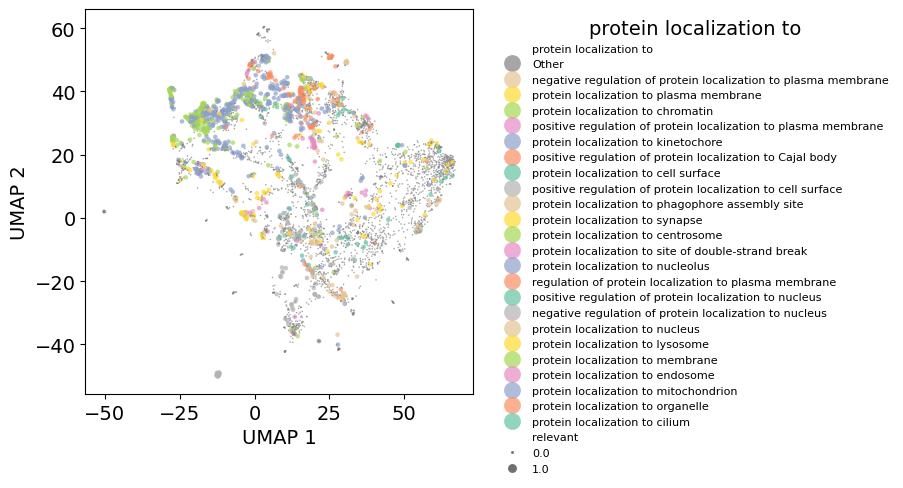

In [424]:
term_snippet = 'protein localization to'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 10 GO terms with 'checkpoint' in their name
Unique GO terms: ['mitotic spindle assembly checkpoint signaling', 'DNA replication checkpoint signaling', 'mitotic DNA replication checkpoint signaling', 'regulation of DNA damage checkpoint', 'positive regulation of mitotic cell cycle spindle assembly checkpoint', 'DNA damage checkpoint signaling', 'mitotic G2/M transition checkpoint', 'mitotic intra-S DNA damage checkpoint signaling', 'mitotic G2 DNA damage checkpoint signaling', 'mitotic G1 DNA damage checkpoint signaling']


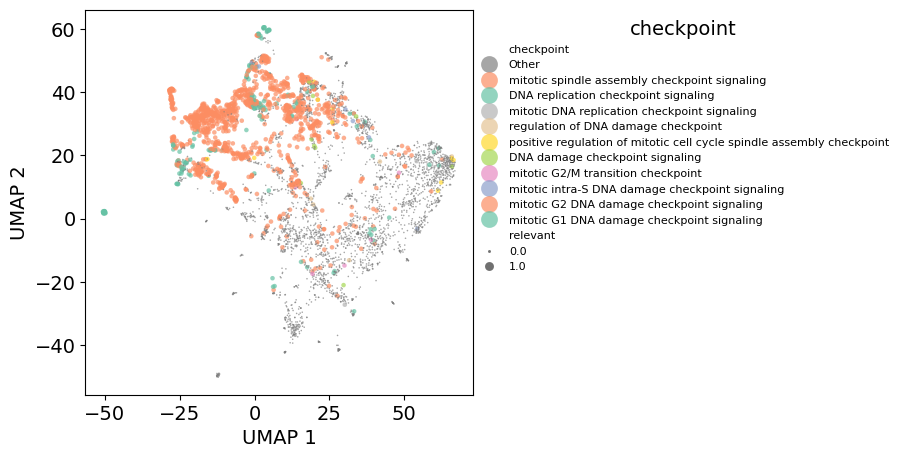

In [299]:
term_snippet = 'checkpoint'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 9 GO terms with 'blood' in their name
Unique GO terms: ['blood circulation', 'blood vessel development', 'transport across blood-brain barrier', 'blood coagulation', 'regulation of blood pressure', 'positive regulation of blood vessel endothelial cell migration', 'negative regulation of blood vessel endothelial cell migration', 'blood vessel remodeling', 'branching involved in blood vessel morphogenesis']


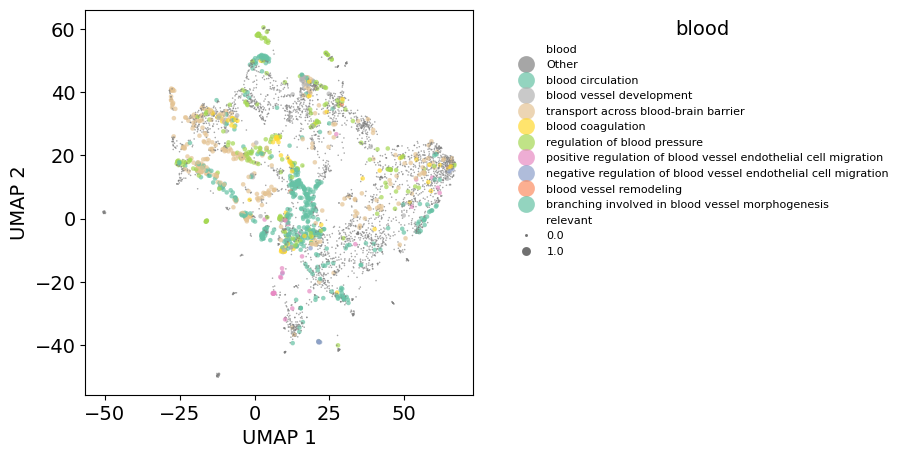

In [302]:
term_snippet = 'blood'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 9 GO terms with 'iron' in their name
Unique GO terms: ['response to iron ion', 'multicellular organismal-level iron ion homeostasis', 'iron ion transport', 'intracellular iron ion homeostasis', 'iron-sulfur cluster assembly', '4 iron, 4 sulfur cluster binding', 'ferrous iron binding', '2 iron, 2 sulfur cluster binding', 'iron ion binding']


/tmp/ipykernel_2077617/3837878175.py:22: UserWarning: 
The palette list has fewer values (9) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


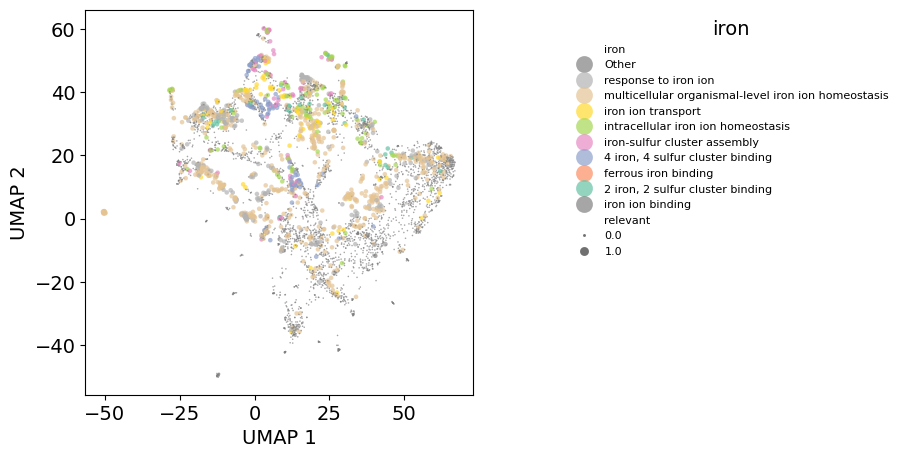

In [303]:
term_snippet = 'iron'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 4 GO terms with 'erythro' in their name
Unique GO terms: ['erythrocyte development', 'positive regulation of erythrocyte differentiation', 'erythrocyte differentiation', 'erythrocyte maturation']


/tmp/ipykernel_2077617/1043439363.py:22: UserWarning: 
The palette list has fewer values (4) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


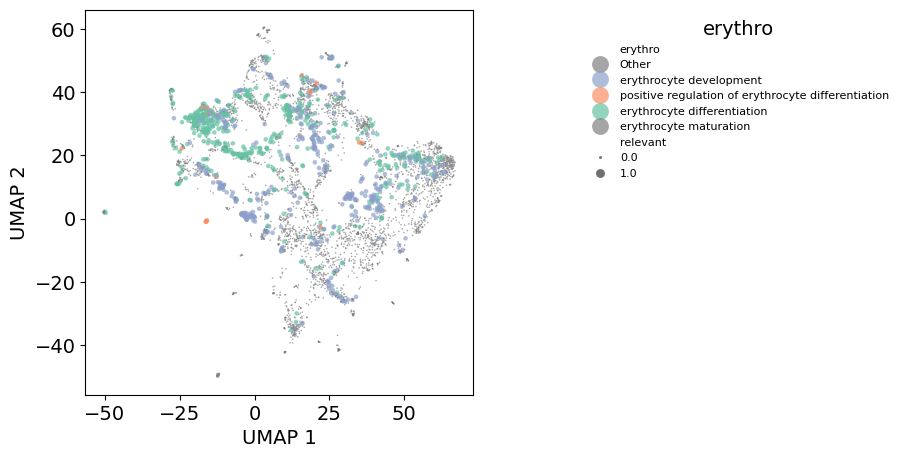

In [304]:
term_snippet = 'erythro'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 7 GO terms with 'innate' in their name
Unique GO terms: ['antifungal innate immune response', 'innate immune response', 'regulation of innate immune response', 'positive regulation of innate immune response', 'antiviral innate immune response', 'negative regulation of innate immune response', 'activation of innate immune response']


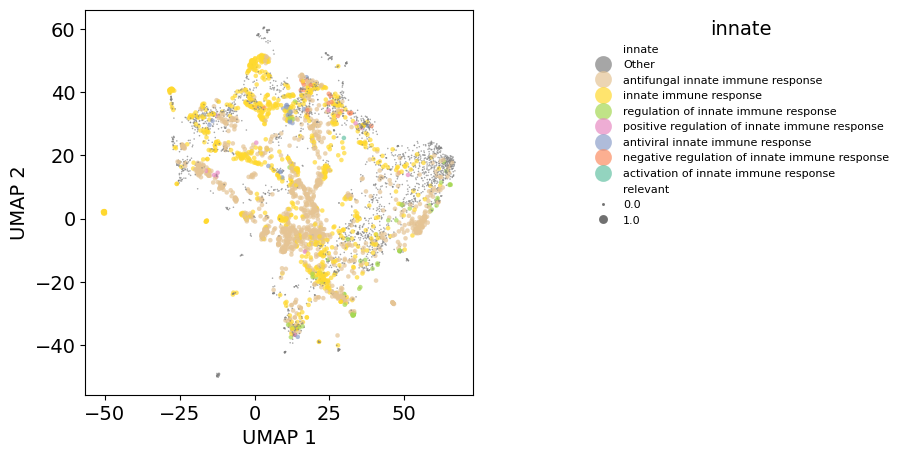

In [305]:
term_snippet = 'innate'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 1 GO terms with 'adaptive' in their name


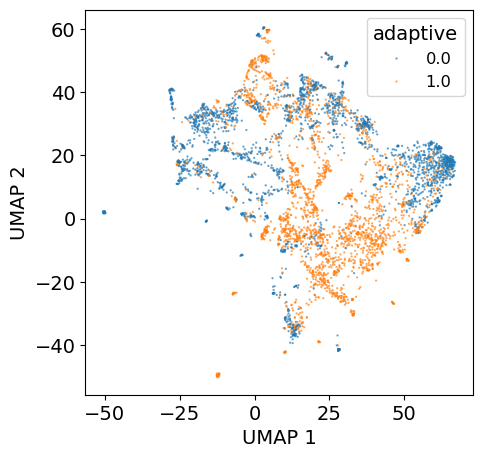

In [306]:
# what about receptors

term_snippet = 'adaptive'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 1 GO terms with 'bacteria' in their name


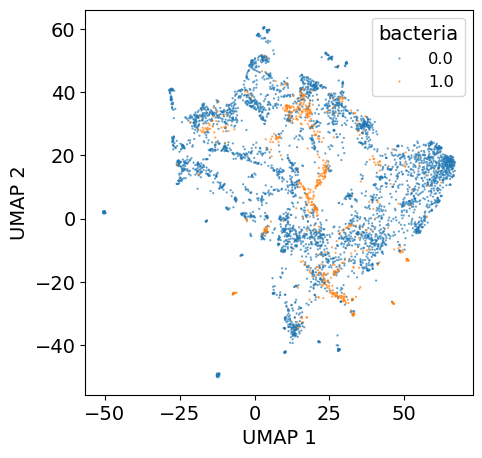

In [307]:
# what about receptors

term_snippet = 'bacteria'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 14 GO terms with 'viral' in their name
Unique GO terms: ['negative regulation of viral genome replication', 'negative regulation of viral entry into host cell', 'antiviral innate immune response', 'viral budding via host ESCRT complex', 'IRES-dependent viral translational initiation', 'viral budding from plasma membrane', 'positive regulation of viral entry into host cell', 'positive regulation of viral genome replication', 'negative regulation of viral transcription', 'positive regulation by host of viral genome replication', 'negative regulation by host of viral transcription', 'viral protein processing', 'suppression of viral release by host', 'viral release from host cell']


/tmp/ipykernel_2077617/201544743.py:23: UserWarning: 
The palette list has fewer values (12) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


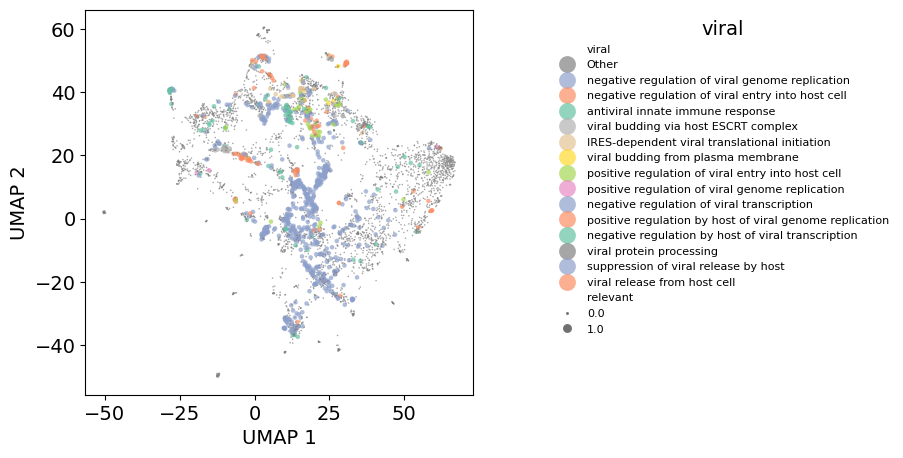

In [308]:
term_snippet = 'viral'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
# set the order to 'Other' first
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 23 GO terms with 'interleukin-' in their name
Unique GO terms: ['negative regulation of interleukin-12 production', 'negative regulation of interleukin-2 production', 'positive regulation of interleukin-4 production', 'negative regulation of interleukin-10 production', 'positive regulation of interleukin-10 production', 'positive regulation of interleukin-2 production', 'positive regulation of interleukin-1 beta production', 'negative regulation of interleukin-6 production', 'cellular response to interleukin-1', 'positive regulation of interleukin-12 production', 'positive regulation of interleukin-8 production', 'positive regulation of interleukin-6 production', 'negative regulation of interleukin-8 production', 'positive regulation of interleukin-13 production', 'negative regulation of interleukin-17 production', 'interleukin-1-mediated signaling pathway', 'interleukin-15-mediated signaling pathway', 'negative regulation of interleukin-1 beta production', 'positive regulation o

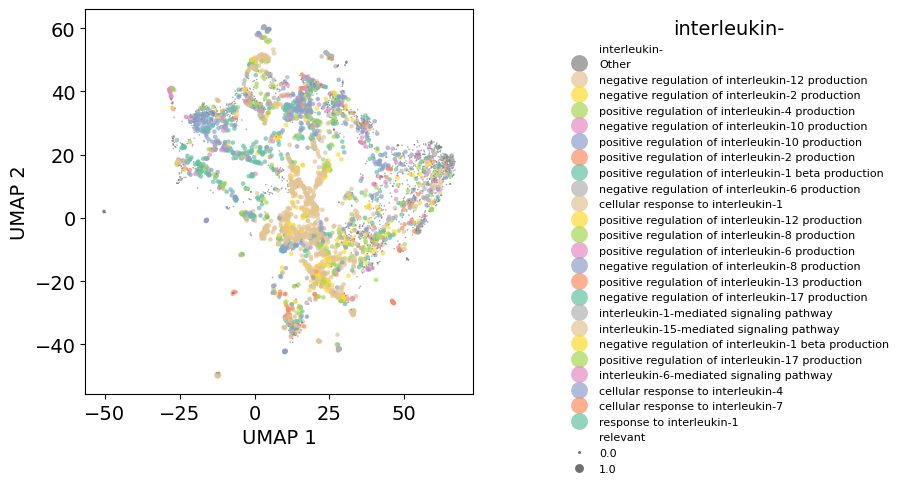

In [313]:
term_snippet = 'interleukin-'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
# set the order to 'Other' first
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 2 GO terms with 'interleukin-2' in their name


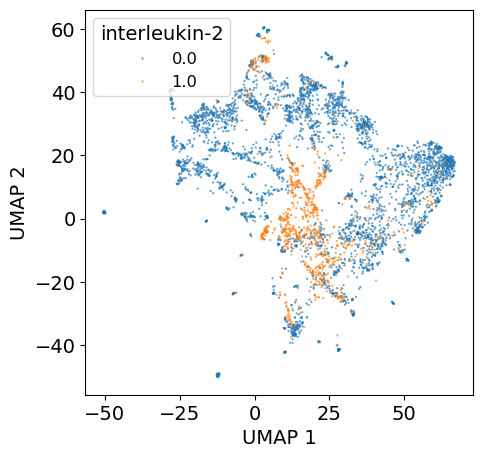

In [309]:
# what about receptors

term_snippet = 'interleukin-2'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 2 GO terms with 'interleukin-4' in their name


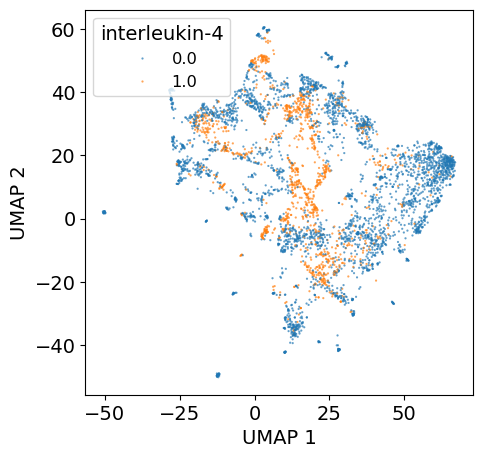

In [310]:
# what about receptors

term_snippet = 'interleukin-4'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 1 GO terms with 'interleukin-7' in their name


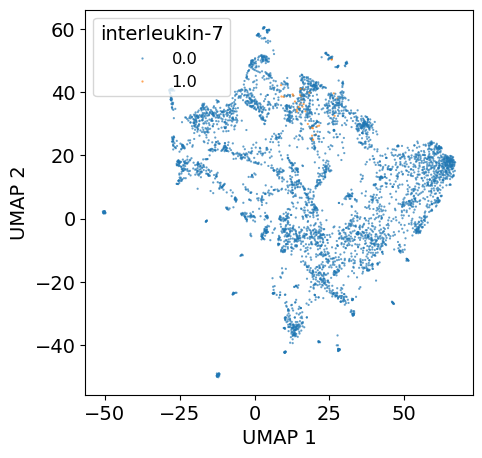

In [311]:
# what about receptors

term_snippet = 'interleukin-7'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

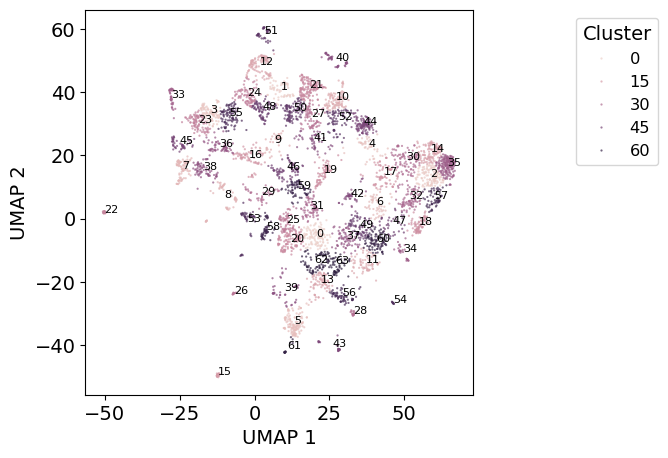

In [316]:
# perform clustering on the umap

from sklearn.cluster import KMeans

n_clusters = 64
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(embedding)
df_umap['cluster'] = kmeans.labels_
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='cluster', s=2, alpha=0.7, ec=None)
# add the number of the cluster over the mean
for i in range(n_clusters):
    cluster_center = kmeans.cluster_centers_[i]
    ax.text(cluster_center[0], cluster_center[1], str(i), fontsize=8, color='black')
plt.legend(title='Cluster', loc='upper right', bbox_to_anchor=(1.5, 1))
plt.show()

In [482]:
# for each cluster, find all unique go terms and their names
cluster_go_terms = {}
for i in range(n_clusters):
    cluster_go_terms[i] = {}
    cluster_go_terms[i]['names'] = go_df[go_df['feature'].isin(df_umap[df_umap['cluster'] == i]['feature'])]['go_name'].unique()
    cluster_go_terms[i]['count'] = len(cluster_go_terms[i]['names'])
    # if the cluster has less than 10 go terms, print the top 5 go terms

cluster_id = 35
print(f"Cluster {cluster_id} has {cluster_go_terms[cluster_id]['count']} GO terms:")
go_term_counts_temp = go_df[go_df['feature'].isin(df_umap[df_umap['cluster'] == cluster_id]['feature'])]['go_name'].value_counts().head(10)
print(go_term_counts_temp)
print("\n")

Cluster 35 has 807 GO terms:
calcium ion binding                                    38
cell adhesion                                          23
sequence-specific double-stranded DNA binding          20
inflammatory response                                  18
cytokine-mediated signaling pathway                    17
positive regulation of cytokine production             15
pattern recognition receptor activity                  15
multicellular organismal-level iron ion homeostasis    15
positive regulation of gene expression                 14
G protein-coupled receptor signaling pathway           13
Name: go_name, dtype: int64




Found 3 GO terms with 'B cell proliferation' in their name
Unique GO terms: ['negative regulation of B cell proliferation', 'positive regulation of B cell proliferation', 'B cell proliferation']


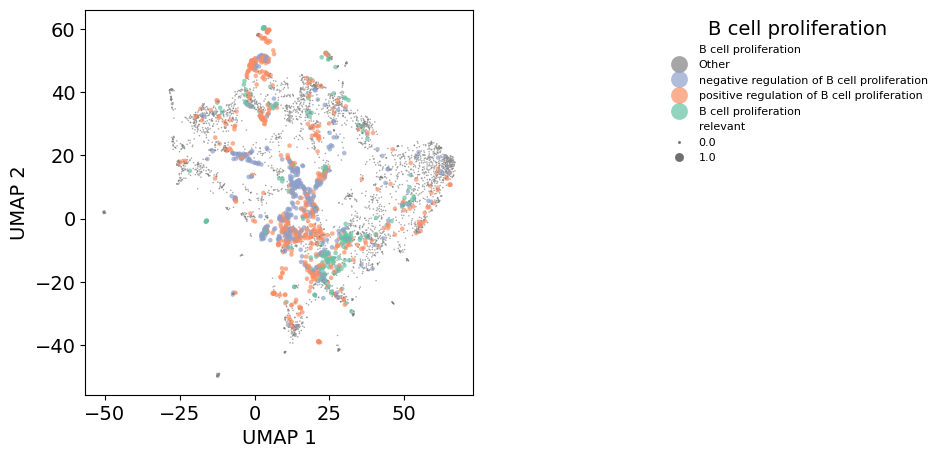

In [432]:
term_snippet = 'B cell proliferation'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 4 GO terms with 'chemokine' in their name
Unique GO terms: ['positive regulation of chemokine production', 'chemokine-mediated signaling pathway', 'cellular response to chemokine', 'chemokine activity']


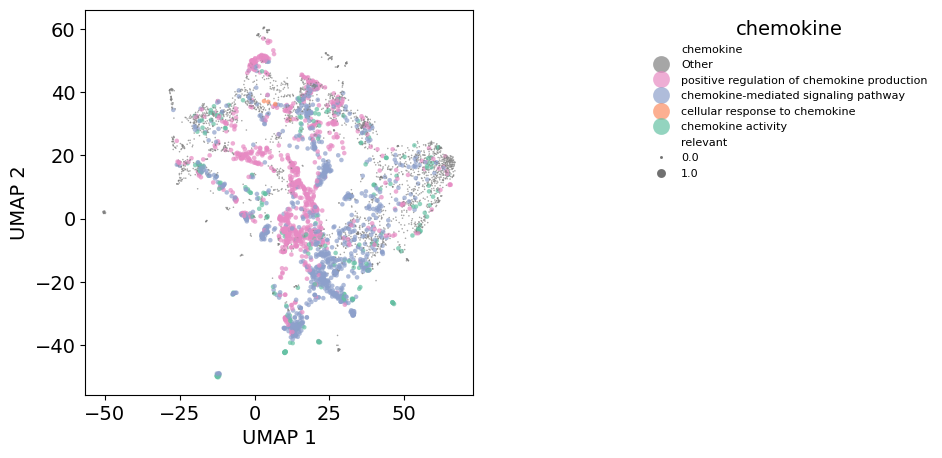

In [433]:
term_snippet = 'chemokine'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 3 GO terms with 'stem cell proliferation' in their name
Unique GO terms: ['stem cell proliferation', 'positive regulation of stem cell proliferation', 'hematopoietic stem cell proliferation']


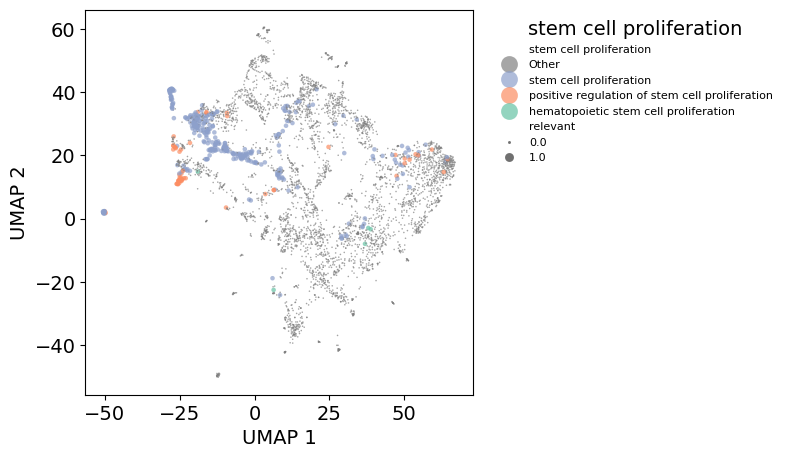

In [437]:
term_snippet = 'stem cell proliferation'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(1.8, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 3 GO terms with 'JAK-STAT' in their name
Unique GO terms: ['cell surface receptor signaling pathway via JAK-STAT', 'growth hormone receptor signaling pathway via JAK-STAT', 'negative regulation of receptor signaling pathway via JAK-STAT']


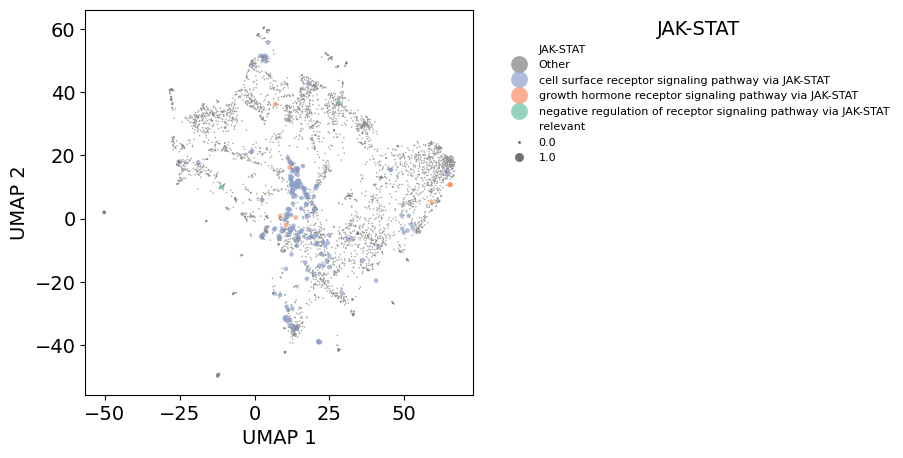

In [489]:
term_snippet = 'JAK-STAT'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = sns.color_palette('Set2', n_colors=len(df_temp[term_snippet].unique())-1)
temp_palette.append((0.5, 0.5, 0.5))  # add grey for 'Other'
temp_palette = temp_palette[::-1]  # reverse the order to have 'Other' last
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.1, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 9 GO terms with 'growth factor receptor signaling pathway' in their name
Unique GO terms: ['platelet-derived growth factor receptor signaling pathway', 'negative regulation of epidermal growth factor receptor signaling pathway', 'hepatocyte growth factor receptor signaling pathway', 'positive regulation of epidermal growth factor receptor signaling pathway', 'vascular endothelial growth factor receptor signaling pathway', 'epidermal growth factor receptor signaling pathway', 'fibroblast growth factor receptor signaling pathway', 'positive regulation of vascular endothelial growth factor receptor signaling pathway', 'insulin-like growth factor receptor signaling pathway']


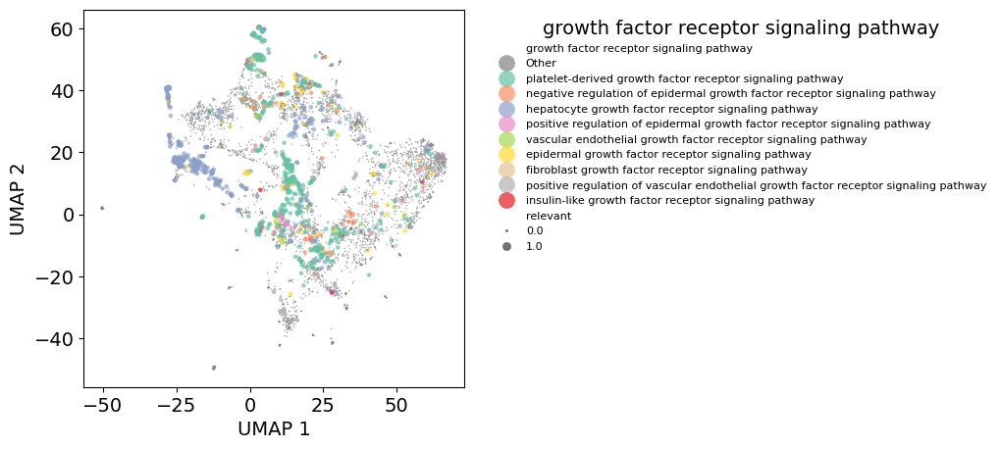

In [496]:
term_snippet = 'growth factor receptor signaling pathway'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.4, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 1 GO terms with 'natural killer cell activation' in their name
Unique GO terms: ['natural killer cell activation']


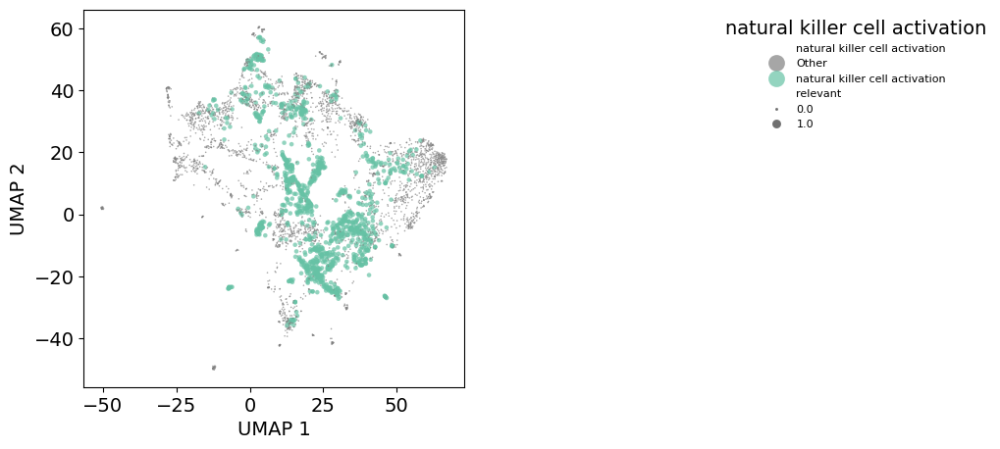

In [510]:
term_snippet = 'natural killer cell activation'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.4, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 14 GO terms with 'viral' in their name
Unique GO terms: ['negative regulation of viral genome replication', 'negative regulation of viral entry into host cell', 'antiviral innate immune response', 'viral budding via host ESCRT complex', 'IRES-dependent viral translational initiation', 'viral budding from plasma membrane', 'positive regulation of viral entry into host cell', 'positive regulation of viral genome replication', 'negative regulation of viral transcription', 'positive regulation by host of viral genome replication', 'negative regulation by host of viral transcription', 'viral protein processing', 'suppression of viral release by host', 'viral release from host cell']


/tmp/ipykernel_2077617/515334241.py:22: UserWarning: 
The palette list has fewer values (12) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


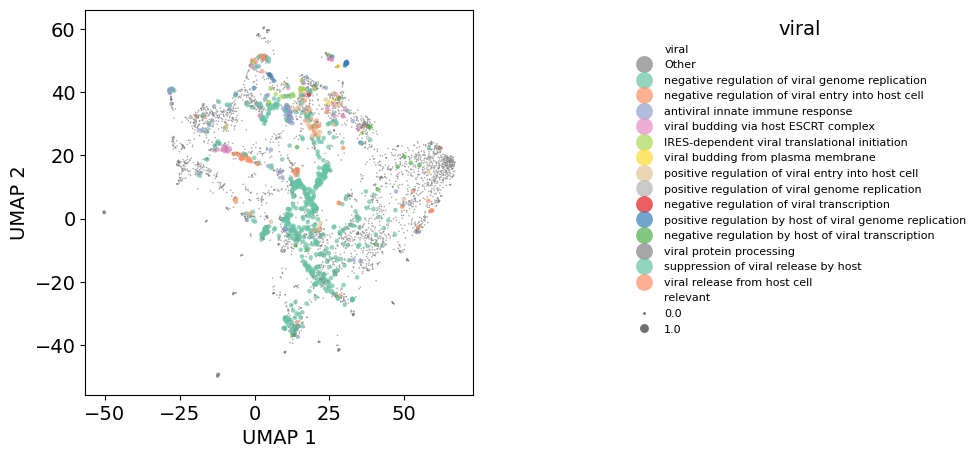

In [508]:
term_snippet = 'viral'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.3, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 3 GO terms with 'starvation' in their name
Unique GO terms: ['cellular response to amino acid starvation', 'cellular response to starvation', 'cellular response to glucose starvation']


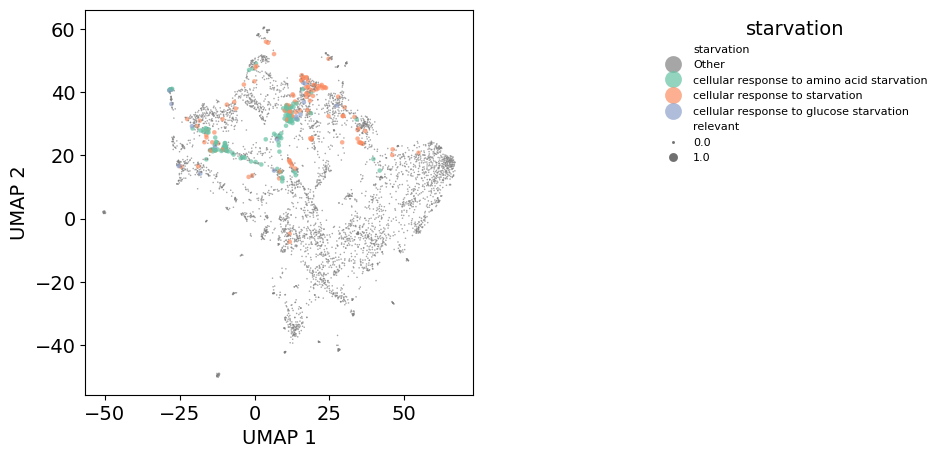

In [440]:
term_snippet = 'starvation'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 4 GO terms with 'polarity' in their name
Unique GO terms: ['regulation of establishment of cell polarity', 'establishment or maintenance of epithelial cell apical/basal polarity', 'establishment of planar polarity', 'establishment of cell polarity']


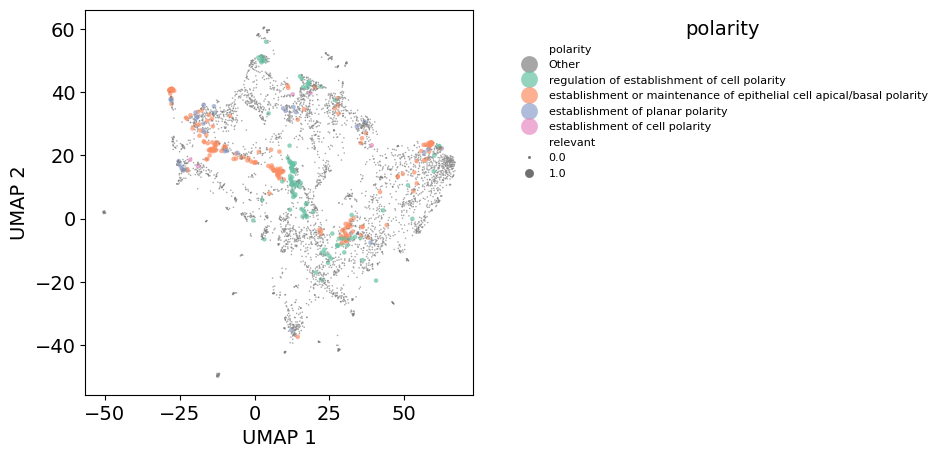

In [441]:
term_snippet = 'polarity'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 14 GO terms with 'damage' in their name
Unique GO terms: ['DNA damage response', 'regulation of DNA damage checkpoint', 'DNA damage checkpoint signaling', 'positive regulation of telomere maintenance in response to DNA damage', 'mitotic intra-S DNA damage checkpoint signaling', 'mitotic G2 DNA damage checkpoint signaling', 'intrinsic apoptotic signaling pathway in response to DNA damage by p53 class mediator', 'intrinsic apoptotic signaling pathway in response to DNA damage', 'negative regulation of intrinsic apoptotic signaling pathway in response to DNA damage by p53 class mediator', 'DNA damage response, signal transduction by p53 class mediator resulting in cell cycle arrest', 'negative regulation of DNA damage response, signal transduction by p53 class mediator', 'mitotic G1 DNA damage checkpoint signaling', 'ATP-dependent DNA damage sensor activity', 'damaged DNA binding']


/tmp/ipykernel_2077617/844022092.py:22: UserWarning: 
The palette list has fewer values (13) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


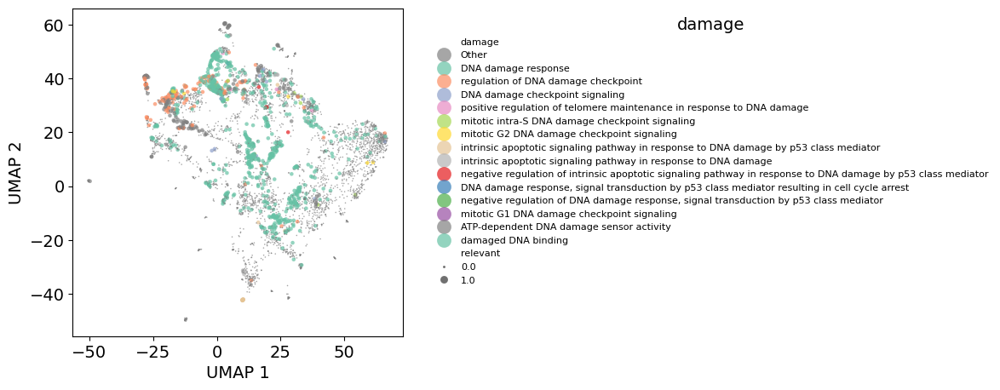

In [443]:
term_snippet = 'damage'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.8, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 13 GO terms with 'stem cell' in their name
Unique GO terms: ['stem cell proliferation', 'stem cell differentiation', 'positive regulation of stem cell proliferation', 'somatic stem cell population maintenance', 'hematopoietic stem cell homeostasis', 'regulation of stem cell population maintenance', 'positive regulation of stem cell population maintenance', 'negative regulation of stem cell differentiation', 'regulation of hematopoietic stem cell differentiation', 'negative regulation of stem cell population maintenance', 'neuronal stem cell population maintenance', 'hematopoietic stem cell proliferation', 'stem cell factor receptor activity']


/tmp/ipykernel_2077617/2535608895.py:22: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


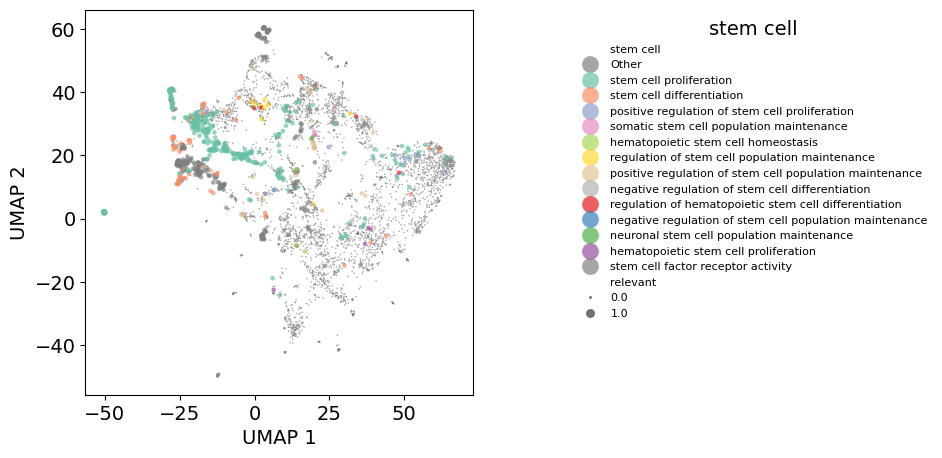

In [444]:
term_snippet = 'stem cell'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 12 GO terms with 'maturation' in their name
Unique GO terms: ['autophagosome maturation', 'regulation of synapse maturation', 'protein maturation', 'maturation of SSU-rRNA', 'oocyte maturation', 'maturation of SSU-rRNA from tricistronic rRNA transcript (SSU-rRNA, 5.8S rRNA, LSU-rRNA)', 'neuron maturation', 'maturation of LSU-rRNA from tricistronic rRNA transcript (SSU-rRNA, 5.8S rRNA, LSU-rRNA)', 'erythrocyte maturation', 'cell maturation', 'maturation of 5.8S rRNA', 'phagosome maturation']


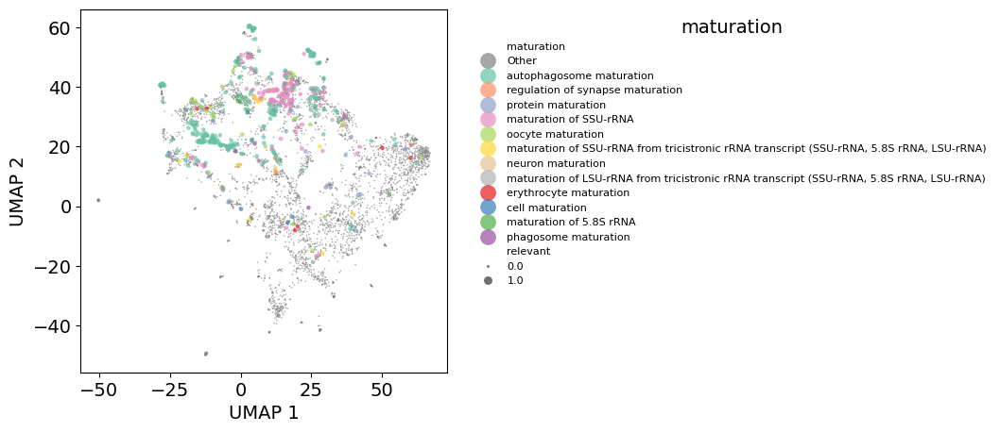

In [445]:
term_snippet = 'maturation'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.5, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 7 GO terms with 'telomere' in their name
Unique GO terms: ['telomere maintenance', 'positive regulation of telomere maintenance via telomerase', 'regulation of telomere maintenance', 'telomere maintenance via telomerase', 'positive regulation of telomere maintenance in response to DNA damage', 'telomere maintenance via recombination', 'positive regulation of telomere maintenance']


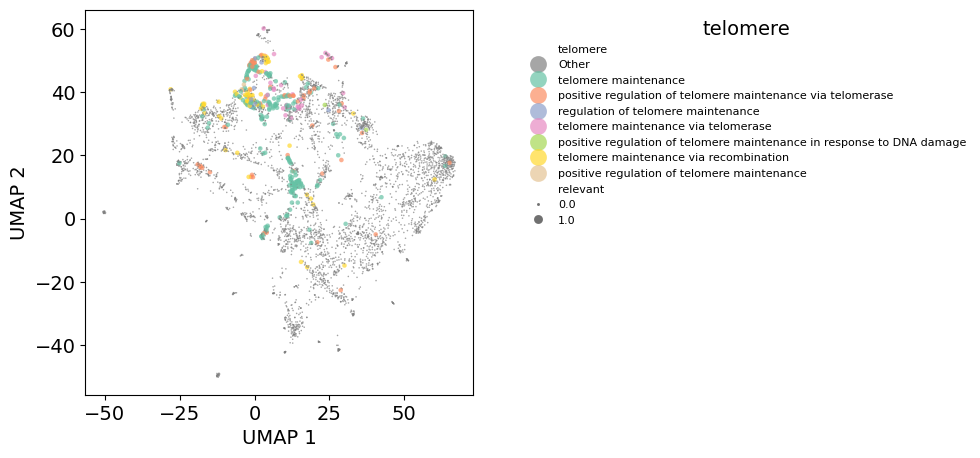

In [447]:
term_snippet = 'telomere'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.3, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 9 GO terms with 'autophagy' in their name
Unique GO terms: ['piecemeal microautophagy of the nucleus', 'macroautophagy', 'positive regulation of autophagy', 'autophagy', 'regulation of macroautophagy', 'autophagy of mitochondrion', 'negative regulation of autophagy', 'regulation of autophagy', 'positive regulation of macroautophagy']


/tmp/ipykernel_2077617/3492395520.py:22: UserWarning: 
The palette list has fewer values (9) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))


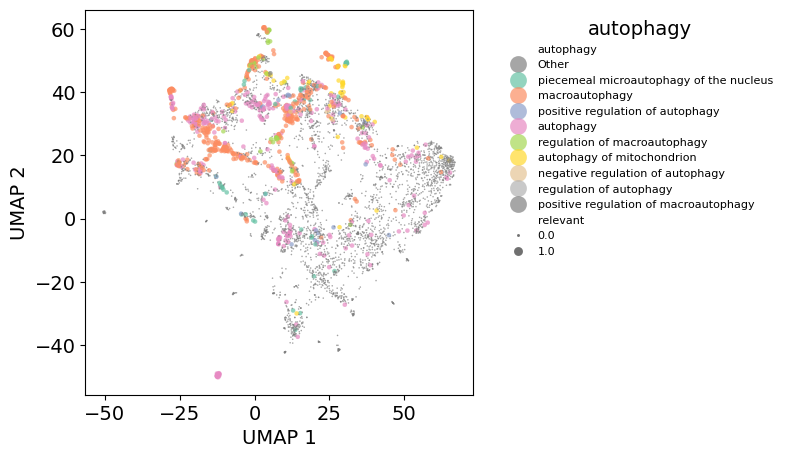

In [449]:
term_snippet = 'autophagy'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(1.8, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 5 GO terms with 'death' in their name
Unique GO terms: ['extrinsic apoptotic signaling pathway via death domain receptors', 'positive regulation of programmed cell death', 'ectopic germ cell programmed cell death', 'negative regulation of extrinsic apoptotic signaling pathway via death domain receptors', 'death receptor binding']


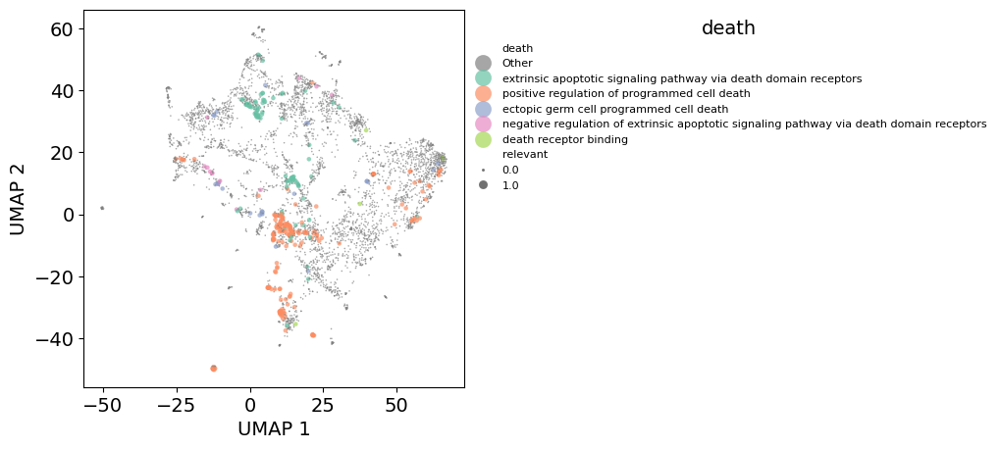

In [450]:
term_snippet = 'death'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.4, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 4 GO terms with 'tissue' in their name
Unique GO terms: ['homeostasis of number of cells within a tissue', 'skeletal muscle tissue development', 'tissue regeneration', 'tissue homeostasis']


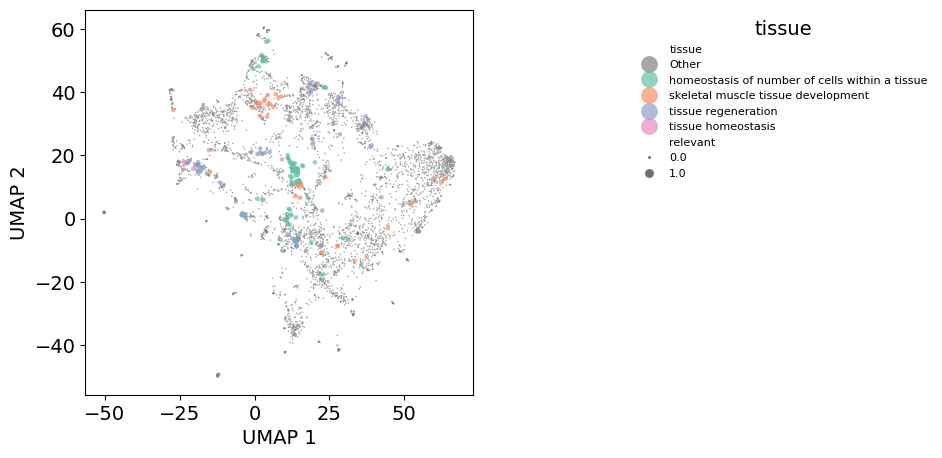

In [452]:
term_snippet = 'tissue'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

Found 1 GO terms with 'interleukin-7' in their name
Unique GO terms: ['cellular response to interleukin-7']


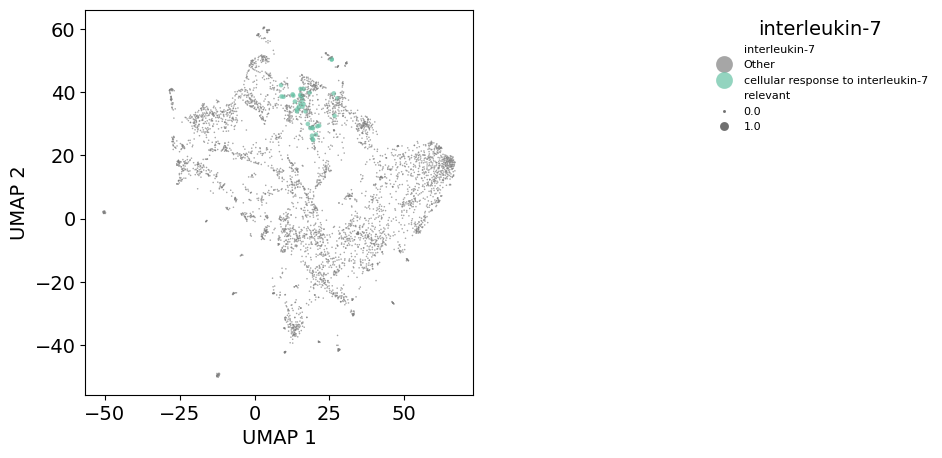

In [463]:
term_snippet = 'interleukin-7'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

In [538]:
global_go_feature_matrix = go_feature_matrix[:, [torch.where(mtrx_feature_ids == i)[0] for i in df_umap[df_umap['feature_type'] == 'global']['feature'].values.tolist()]]

global_go_feature_df = pd.DataFrame({
    'name': mtrx_go_names,
    'feature_counts': go_feature_matrix.sum(dim=1).numpy(),
    'global_feature_counts': global_go_feature_matrix.sum(dim=1).numpy()
})
# kick out counts of 0
local_go_feature_df = global_go_feature_df[global_go_feature_df['global_feature_counts'] == 0]
global_go_feature_df = global_go_feature_df[global_go_feature_df['global_feature_counts'] > 0]

In [539]:
# sort by global feature counts
global_go_feature_df = global_go_feature_df.sort_values(by='global_feature_counts', ascending=False)
global_go_feature_df.head(10)

,name,feature_counts,global_feature_counts
62,immune response,2411.0,1943.0
72,cell surface receptor signaling pathway,2265.0,1807.0
135,inflammatory response,2305.0,1796.0
1653,transmembrane signaling receptor activity,2242.0,1790.0
55,adaptive immune response,2220.0,1750.0
12,cell adhesion,1990.0,1566.0
39,positive regulation of natural killer cell med...,1957.0,1443.0
1640,pattern recognition receptor activity,1770.0,1416.0
1658,coreceptor activity,1689.0,1302.0
79,cell-cell signaling,1633.0,1299.0


In [555]:
# sort by global feature counts
global_go_feature_df = global_go_feature_df.sort_values(by='global_feature_counts', ascending=True)
global_go_feature_df[global_go_feature_df['global_feature_counts'] >= 100].head(10)

,name,feature_counts,global_feature_counts
557,adenylate cyclase-modulating G protein-coupled...,159.0,100.0
1830,cysteine-type endopeptidase activator activity...,129.0,101.0
400,protein localization to chromatin,171.0,101.0
1925,protein kinase C binding,140.0,101.0
681,substantia nigra development,149.0,101.0
773,negative regulation of cell adhesion,124.0,102.0
686,positive regulation of TORC1 signaling,179.0,102.0
580,canonical NF-kappaB signal transduction,142.0,102.0
1744,epidermal growth factor receptor binding,140.0,102.0
254,chloride transport,121.0,103.0


Found 4 GO terms with 'chloride' in their name
Unique GO terms: ['chloride transport', 'chloride transmembrane transport', 'chloride channel activity', 'chloride transmembrane transporter activity']


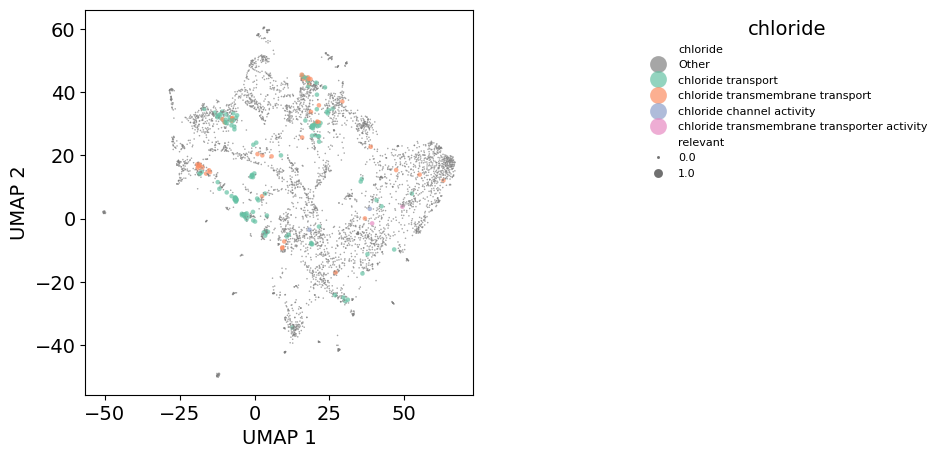

In [557]:
term_snippet = 'chloride'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()

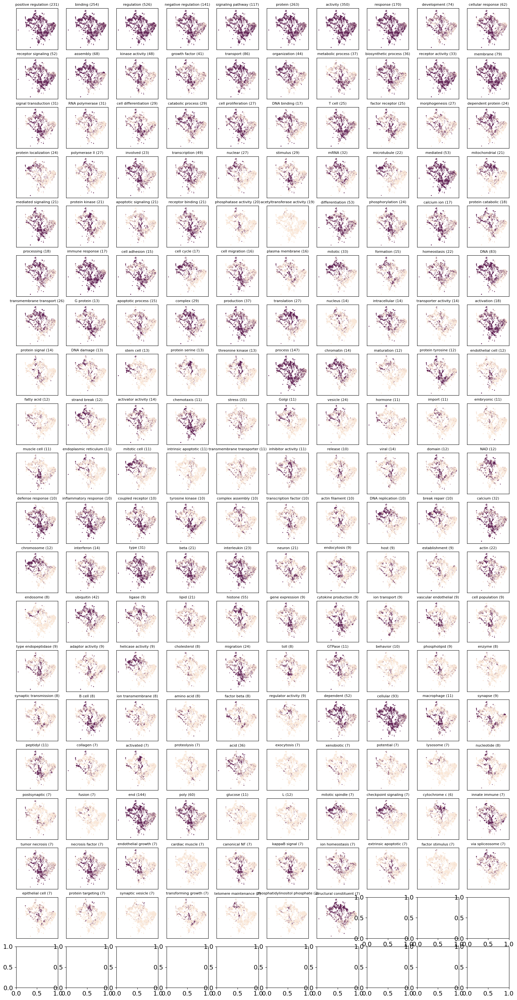

In [361]:
n_cols = 10
n_rows = math.ceil(len(wordcloud.words_.keys()) / n_cols)

binary_colors = sns.color_palette('rocket_r', 100)
binary_colors = [binary_colors[0], binary_colors[75]]

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))

i = 0
for term_snippet in wordcloud.words_.keys():
    test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
    if sum(test_go_terms) == 0:
        continue
    #print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
    #print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
    test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
    #test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
    test_counts = (test_counts > 0).float()
    df_temp = df_umap.copy()
    df_temp[term_snippet] = test_counts.numpy()
    sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=1, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols], palette=binary_colors)
    ax[i//n_cols, i%n_cols].set_title(term_snippet + f" ({sum(test_go_terms)})", fontsize=8)
    ax[i//n_cols, i%n_cols].get_legend().remove()
    # remove ticks and labels
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    ax[i//n_cols, i%n_cols].set_xlabel('')
    ax[i//n_cols, i%n_cols].set_ylabel('')
    i += 1
plt.show()

### Plotting features by fold change

In [77]:
# load the PCA
df_pca = pd.read_csv("03_results/reports/human_bonemarrow_l20_h2-3_test50e_pca.csv")

feat_palette = sns.color_palette('rocket_r', as_cmap=True)

Feature 4139: negative regulation of phosphorylation
Feature 6205: antifungal innate immune response
Feature 5128: positive regulation of monocyte chemotactic protein-1 production
Feature 6116: positive regulation of monocyte chemotaxis
Feature 9759: chemokine-mediated signaling pathway
Feature 9836: negative regulation of G protein-coupled receptor signaling pathway
Feature 9796: chemokine-mediated signaling pathway
Feature 8603: respiratory gaseous exchange by respiratory system
Feature 8242: killing of cells of another organism
Feature 3813: chemokine-mediated signaling pathway
Feature 1198: dendritic spine morphogenesis
Feature 2354: ionotropic glutamate receptor binding
Feature 2668: cardiac muscle cell development
Feature 9765: positive regulation of chondrocyte differentiation
Feature 576: antifungal innate immune response
Feature 2911: antifungal innate immune response
Feature 1797: antifungal innate immune response
Feature 8622: positive regulation of p38MAPK cascade
Feature 4

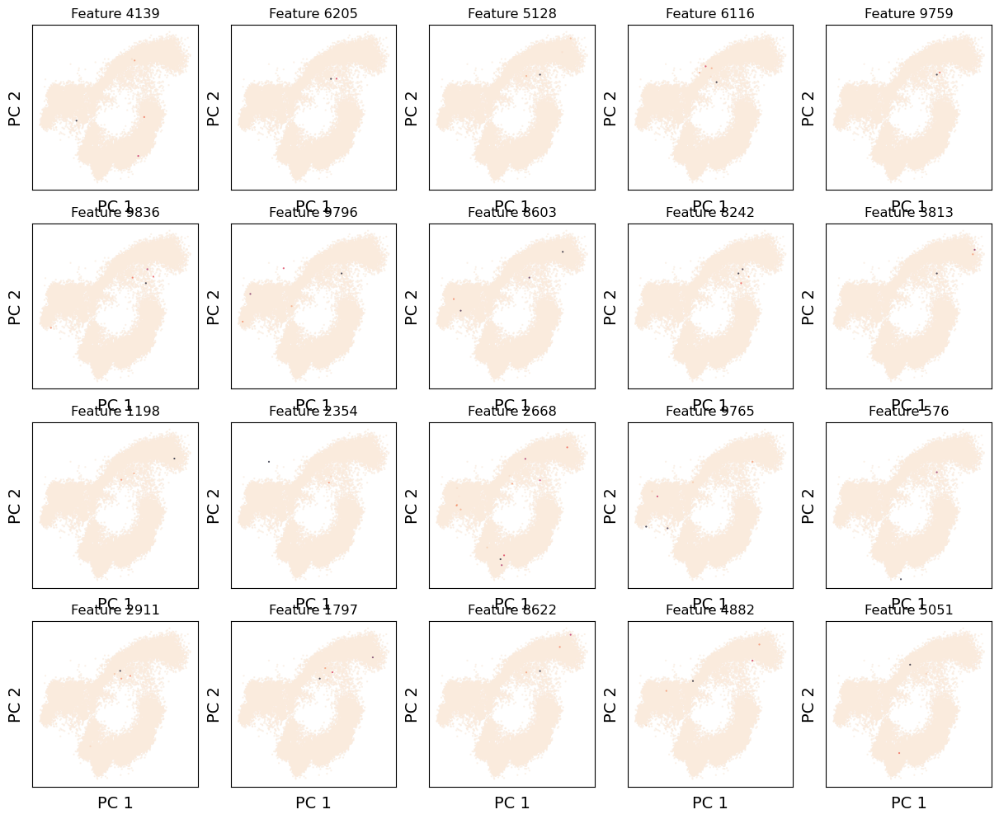

In [78]:
# now look at some global features

global_df = go_df[(go_df['feature_type'] == 'global')]
#global_df['n_active_cells'] = global_df['feature'].apply(lambda x: torch.sum(activations[:,x] != 0).item())

# sort the df by fold change and plot the top 20 features

global_df = global_df.sort_values(by='binom_fold_change', ascending=False)
#global_df = global_df.sort_values(by='n_active_cells', ascending=False)
global_df_unique = global_df['feature'].unique()

n_cols = 5
n_rows = math.ceil(20 / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

for i, feat in enumerate(global_df_unique[:20]):
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # print the top go term
    temp_go_term = go_df[go_df['feature'] == feat]['go_name'].values[0]
    print('Feature {}: {}'.format(feat, temp_go_term))
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

In [79]:
# what are the go terms in the top 95th percentile of global fold changes

global_df = global_df.sort_values(by='binom_fold_change', ascending=False)
percentile_99 = global_df['binom_fold_change'].quantile(0.99)
global_df_99 = global_df[global_df['binom_fold_change'] >= percentile_99]
print(global_df_99['go_name'].value_counts())
# save these valuecounts in a table
#global_df_99['go_name'].value_counts().to_csv('03_results/reports/top_99_percentile_global_go_terms.csv')

antifungal innate immune response                                               89
chemokine activity                                                              65
D-mannose binding                                                               55
pattern recognition receptor activity                                           43
chemokine-mediated signaling pathway                                            41
                                                                                ..
spectrin binding                                                                 1
execution phase of apoptosis                                                     1
positive regulation of neutrophil chemotaxis                                     1
keratinocyte differentiation                                                     1
cysteine-type endopeptidase inhibitor activity involved in apoptotic process     1
Name: go_name, Length: 593, dtype: int64


In [80]:
#same for local
local_df = go_df[(go_df['feature_type'] == 'local')]
local_df = local_df.sort_values(by='binom_fold_change', ascending=False)
percentile_99 = local_df['binom_fold_change'].quantile(0.99)
local_df_99 = local_df[local_df['binom_fold_change'] >= percentile_99]
print(local_df_99['go_name'].value_counts())
# save these valuecounts in a table
#local_df_99['go_name'].value_counts().to_csv('03_results/reports/top_99_percentile_local_go_terms.csv')

pattern recognition receptor activity                               49
antifungal innate immune response                                   41
positive regulation of natural killer cell mediated cytotoxicity    33
immune response-regulating signaling pathway                        29
chemokine activity                                                  28
                                                                    ..
keratinocyte differentiation                                         1
thymus development                                                   1
canonical glycolysis                                                 1
negative regulation of viral entry into host cell                    1
positive regulation of ATP-dependent activity                        1
Name: go_name, Length: 363, dtype: int64


In [81]:
# save the one for all since there seems to be little difference

percentile_99 = go_df['binom_fold_change'].quantile(0.99)
go_df_99 = go_df[go_df['binom_fold_change'] >= percentile_99]
print(go_df_99['go_name'].value_counts())
# save these valuecounts in a table
#go_df_99['go_name'].value_counts().to_csv('03_results/reports/top_99_percentile_go_terms.csv')

antifungal innate immune response                               121
chemokine activity                                               84
D-mannose binding                                                71
pattern recognition receptor activity                            69
chemokine-mediated signaling pathway                             49
                                                               ... 
positive regulation of intrinsic apoptotic signaling pathway      1
proton motive force-driven ATP synthesis                          1
endothelial cell migration                                        1
regulation of cytoskeleton organization                           1
nucleosomal DNA binding                                           1
Name: go_name, Length: 729, dtype: int64


In [82]:
# look for feature 2306

feat = 2306
feat_df = go_df[go_df['feature'] == feat]
# look at the go terms for 95th percentile of fold changes
#percentile_95 = feat_df['binom_fold_change'].quantile(0.95)
#feat_df_95 = feat_df[feat_df['binom_fold_change'] >= percentile_95]
#feat_df_95['go_name'].value_counts()
feat_df[['binom_pval', 'binom_fold_change', 'mw_pval', 'go_name']]

,binom_pval,binom_fold_change,mw_pval,go_name


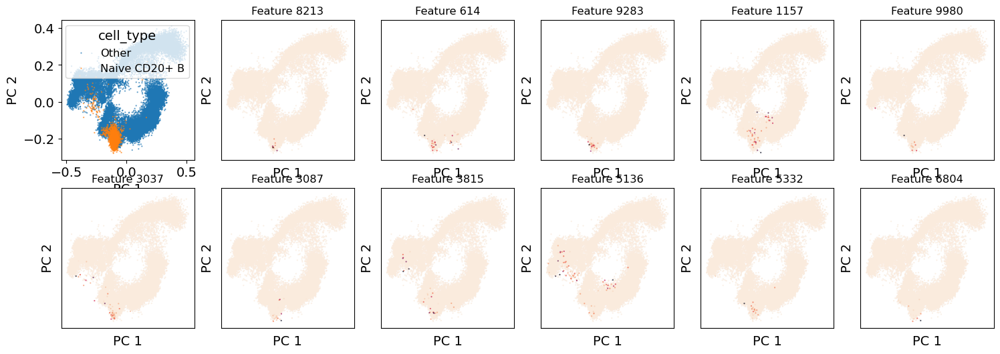

In [83]:
cd20nb_df = go_df[(go_df['feature_type'] == 'local') & (go_df['celltype'] == 'Naive CD20+ B')]

# list all go terms per feature
for feat in cd20nb_df['feature'].unique():
    #print('Feature: {}'.format(feat))
    feat_df = cd20nb_df[cd20nb_df['feature'] == feat]
    #print(feat_df.head()['go_name'].values)

n_cols = 6
n_rows = math.ceil((len(cd20nb_df['feature'].unique())+1) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

# first plot should just show the location of the cell type
df_temp = df_pca.copy()
df_temp['cell_type'] = ['Naive CD20+ B' if x == 'Naive CD20+ B' else 'Other' for x in data.obs['cell_type']]
# sort by cell type (with Naive CD20+ B last)
df_temp = df_temp.sort_values(by='cell_type', ascending=False)
sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='cell_type', s=2, alpha=0.7, ec=None, ax=ax[0,0])

for j, feat in enumerate(cd20nb_df['feature'].unique()):
    i = j+1
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

In [84]:
# look for feature 2306

feat = 1238
feat_df = go_df[go_df['feature'] == feat]
# look at the go terms for 95th percentile of fold changes
#percentile_95 = feat_df['binom_fold_change'].quantile(0.95)
#feat_df_95 = feat_df[feat_df['binom_fold_change'] >= percentile_95]
#feat_df_95['go_name'].value_counts()
feat_df[['binom_pval', 'binom_fold_change', 'mw_pval', 'go_name']]

,binom_pval,binom_fold_change,mw_pval,go_name


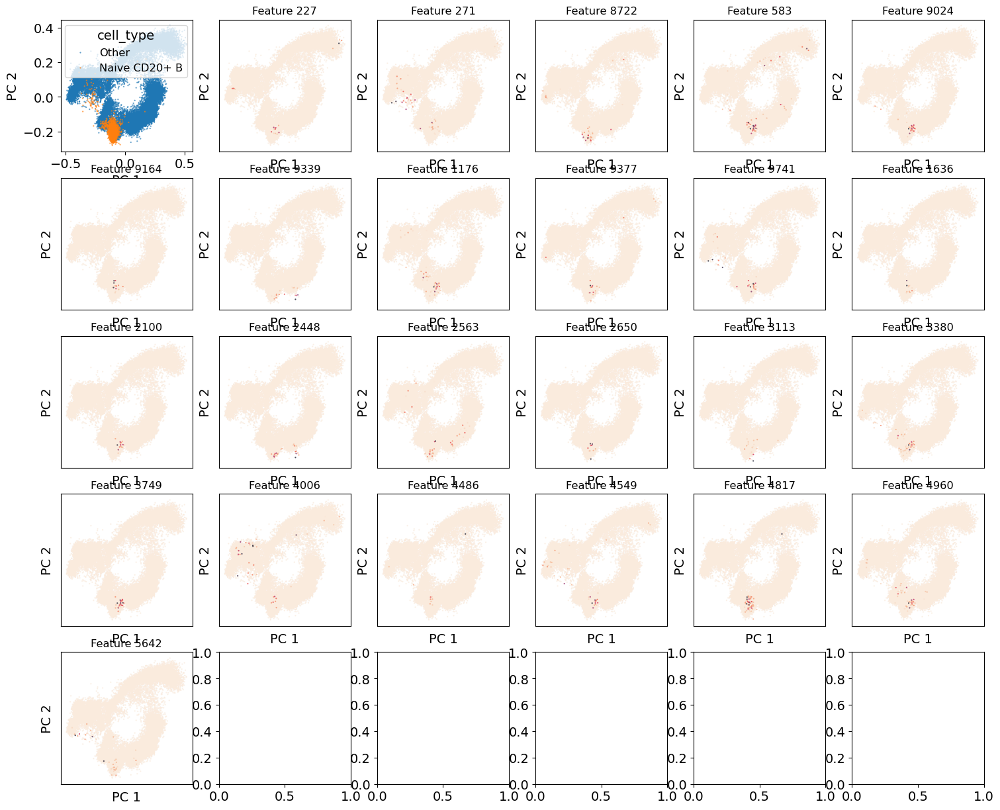

In [85]:
cd20nb_df = go_df[(go_df['feature_type'] == 'local') & (go_df['celltype'] == 'B1 B')]

# list all go terms per feature
for feat in cd20nb_df['feature'].unique():
    #print('Feature: {}'.format(feat))
    feat_df = cd20nb_df[cd20nb_df['feature'] == feat]
    #print(feat_df.head()['go_name'].values)

n_cols = 6
n_rows = math.ceil((len(cd20nb_df['feature'].unique())+1) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

# first plot should just show the location of the cell type
df_temp = df_pca.copy()
df_temp['cell_type'] = ['Naive CD20+ B' if x == 'Naive CD20+ B' else 'Other' for x in data.obs['cell_type']]
# sort by cell type (with Naive CD20+ B last)
df_temp = df_temp.sort_values(by='cell_type', ascending=False)
sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='cell_type', s=2, alpha=0.7, ec=None, ax=ax[0,0])

for j, feat in enumerate(cd20nb_df['feature'].unique()):
    i = j+1
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

In [86]:
# look for feature 2306

feat = 5205
feat_df = go_df[go_df['feature'] == feat]
# look at the go terms for 95th percentile of fold changes
#percentile_95 = feat_df['binom_fold_change'].quantile(0.95)
#feat_df_95 = feat_df[feat_df['binom_fold_change'] >= percentile_95]
#feat_df_95['go_name'].value_counts()
feat_df[['binom_pval', 'binom_fold_change', 'mw_pval', 'go_name']]

,binom_pval,binom_fold_change,mw_pval,go_name


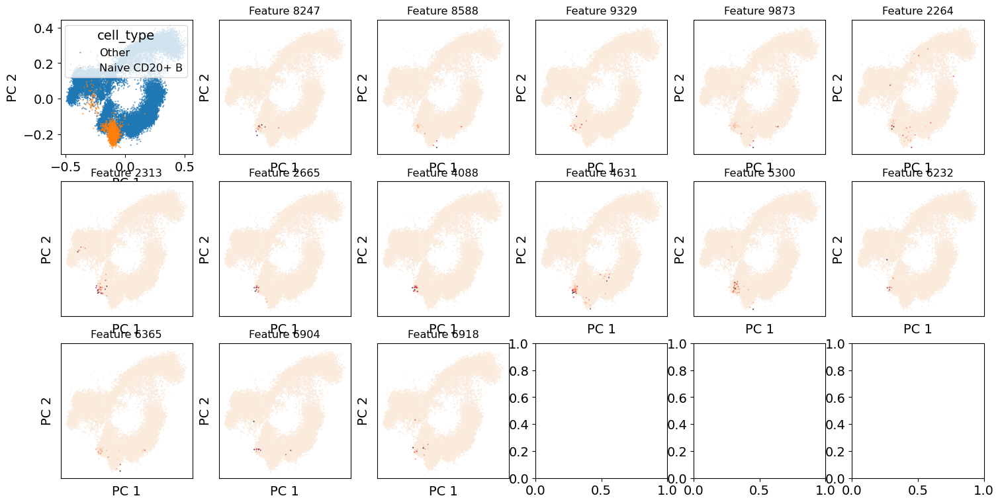

In [87]:
cd20nb_df = go_df[(go_df['feature_type'] == 'local') & (go_df['celltype'] == 'Transitional B')]

# list all go terms per feature
for feat in cd20nb_df['feature'].unique():
    #print('Feature: {}'.format(feat))
    feat_df = cd20nb_df[cd20nb_df['feature'] == feat]
    #print(feat_df.head()['go_name'].values)

n_cols = 6
n_rows = math.ceil((len(cd20nb_df['feature'].unique())+1) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

# first plot should just show the location of the cell type
df_temp = df_pca.copy()
df_temp['cell_type'] = ['Naive CD20+ B' if x == 'Naive CD20+ B' else 'Other' for x in data.obs['cell_type']]
# sort by cell type (with Naive CD20+ B last)
df_temp = df_temp.sort_values(by='cell_type', ascending=False)
sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='cell_type', s=2, alpha=0.7, ec=None, ax=ax[0,0])

for j, feat in enumerate(cd20nb_df['feature'].unique()):
    i = j+1
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

### try to make a graph based on cosine similarity

In [397]:
# load it
cos_sim_activ = torch.load('03_results/reports/cosine_similarity_activations_active_features.pt')

/tmp/ipykernel_2077617/778243291.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cos_sim_activ = torch.load('03_results/reports/cosine_similarity_activations_active_feat

/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/umap/umap_.py:1401: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


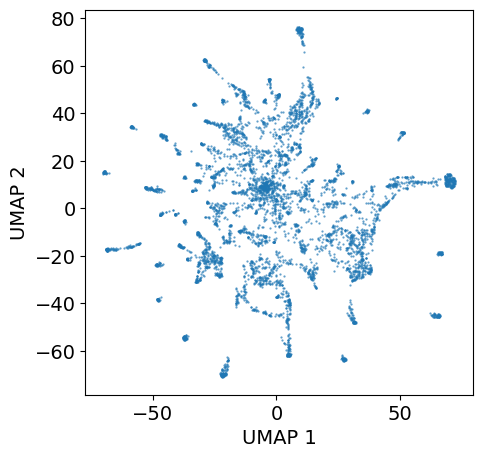

In [402]:
import umap

reducer = umap.UMAP(n_components=2, min_dist=0.5, n_neighbors=20, spread=10, random_state=0)
embedding = reducer.fit_transform(cos_sim_activ)

df_umap_cos = pd.DataFrame(embedding, columns=['UMAP 1', 'UMAP 2'])
df_umap_cos['feature'] = active_features

# plot the UMAP

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', s=2, alpha=0.7, ec=None)
plt.show()

/tmp/ipykernel_2077617/3493817190.py:18: UserWarning: 
The palette list has fewer values (16) than needed (17) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=2, alpha=1, ec=None, palette=level1_palette)


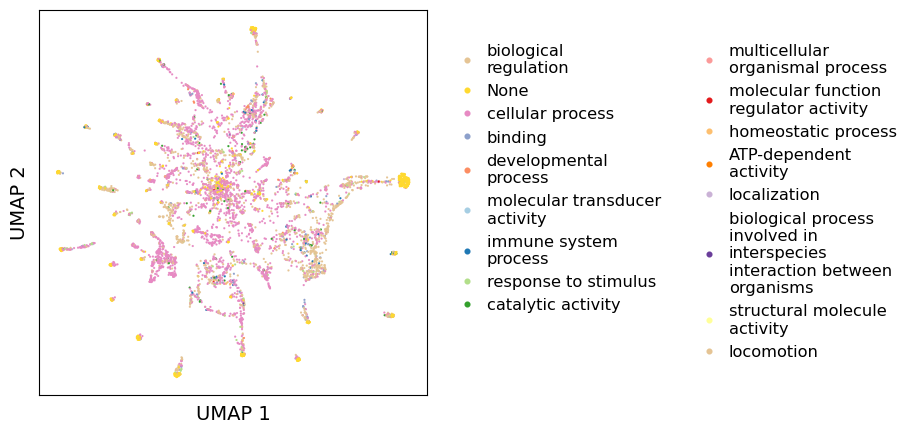

In [403]:
# set the legend font size to small
plt.rcParams.update({'legend.fontsize': 'small'})

# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []

for feat in active_features:
    feat = feat
    try:
        temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    except:
        temp_go_term = 'None'
    level_1_mtrx_terms.append(temp_go_term)

df_umap_cos['level_1_go_term'] = level_1_mtrx_terms

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=2, alpha=1, ec=None, palette=level1_palette)
# if a legend handle is longer than 20 characters, break it up
handles, labels = ax.get_legend_handles_labels()
import textwrap
new_labels = [textwrap.fill(label, 20) for label in labels]
# also make the legend markers larger by scaling
ax.legend(handles, new_labels, loc='upper right', bbox_to_anchor=(2.25, 0.95), markerscale=3, frameon=False, handletextpad=0.2, ncol=2)
# remove ticks
ax.set_xticks([])
ax.set_yticks([])
plt.show()

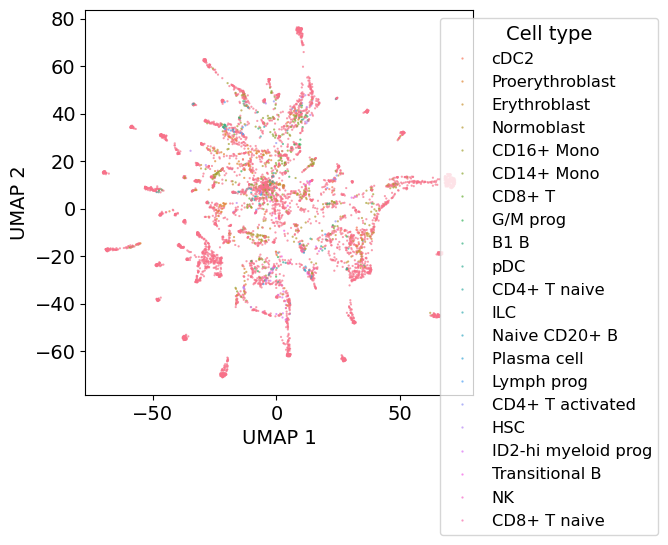

In [ ]:
term_snippet = 'stem cell'

level_1_mtrx_terms = []

for feat in active_features:
    feat = feat
    try:
        temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    except:
        temp_go_term = 'None'
    level_1_mtrx_terms.append(temp_go_term)

df_umap_cos['level_1_go_term'] = level_1_mtrx_terms

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
unique_test_go_terms = [x for x in mtrx_go_names if term_snippet in x]
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
print(f"Unique GO terms: {unique_test_go_terms}")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
# get the index of the max count
max_index = go_feature_matrix[test_go_terms,:].clone().argmax(dim=0)
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
#df_temp[term_snippet] = test_counts.numpy()
df_temp[term_snippet] = [unique_test_go_terms[x] if test_counts[i] == 1 else 'Other' for i, x in enumerate(max_index.numpy())]
df_temp[term_snippet] = pd.Categorical(df_temp[term_snippet], categories=['Other'] + [x for x in unique_test_go_terms if x != 'Other'], ordered=True)
# create a legend where the first color is grey and the rest is default
# get a large palette to start with (Set1 + Set2)
temp_palette = [(0.5, 0.5, 0.5)] + sns.color_palette('Set2') + sns.color_palette('Set1')
temp_palette = temp_palette[:len(df_temp[term_snippet].unique())]
df_temp['relevant'] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, size='relevant', alpha=0.7, ec=None, ax=ax, palette=temp_palette, sizes=(10, 1))
# move legend to the side
ax.legend(title=term_snippet, loc='upper right', bbox_to_anchor=(2.2, 1), frameon=False, markerscale=2, fontsize=8)
plt.show()